In [1]:
#import packages

from __future__ import division
from __future__ import print_function

import os
import sys
from time import time
import itertools

sys.path.append(
    os.path.abspath(os.path.join(os.path.dirname("__file__"), '..')))

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from scipy.io import loadmat

from tabulate import tabulate

from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import plotly.io as pio
import plotly.express as px
import plotly.offline as py

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pickle

from scipy import stats

from pyod.models.iforest import IForest
from pyod.models.knn import KNN
from pyod.models.ocsvm import OCSVM
from pyod.models.lof import LOF


from pyod.utils.utility import standardizer
from pyod.utils.utility import precision_n_scores
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score


import arff
from sklearn.utils import check_array

from base_models import base_models
from em import em, mv, get_em_mv, get_em_mv_original, get_em_mv_ali
from read_data import read_data
from corrstats import *

(-0.8912799047605414, 0.3749185174912557)
(1.0171097212822693, 0.3091012362386931)


In [2]:
#Define variables for models
full_param = []
full_param_headers = []

base_models, randomness_flags =  base_models()
param_tracker = 0

In [3]:
#Define IForest Classifier sets of hyperparameters

classifier_name = "IForest"
param_list = []
param_list_1 = [10, 20, 30, 40, 50, 75, 100, 150, 200]
param_list_2 = [0.005, 0.01, 0.05]
for r in itertools.product(param_list_1, param_list_2): 
    param_list.append((r[0], r[1]))
    param_tracker+=1

full_param.extend(param_list)
full_param_headers.extend([classifier_name]*len(param_list))

In [4]:
#Define kNN Classifier sets of hyperparameters

classifier_name = "kNN"
param_list = []
param_list_1 = ['largest', 'mean', 'median']
param_list_2 = [1, 5 , 15, 25, 50, 70, 100]
param_list_3 = [0.005, 0.01, 0.05]
for r in itertools.product(param_list_1, param_list_2, param_list_3): 
    param_list.append((r[0], r[1], r[2]))
    param_tracker+=1

full_param.extend(param_list)
full_param_headers.extend([classifier_name]*len(param_list))

In [5]:
#Define One Class SVM Classifier sets of hyperparameters

classifier_name = "OCSVM"
param_list = []
param_list_1 = ["linear", "poly", "rbf", "sigmoid"]
param_list_2 = [0.1, 0.3, 0.5, 0.7, 0.9]
param_list_3 = [0.005, 0.01, 0.05]
for r in itertools.product(param_list_1, param_list_2, param_list_3): 
    param_list.append((r[0], r[1], r[2]))
    param_tracker+=1

full_param.extend(param_list)
full_param_headers.extend([classifier_name]*len(param_list))

In [6]:
#Define kNN Classifier sets of hyperparameters

classifier_name = "LOF"
param_list = []
param_list_1 = [1, 5 , 15, 25, 50, 70, 100]
param_list_2 = ['manhattan', 'euclidean', 'minkowski']
param_list_3 = [0.005, 0.01, 0.05]
for r in itertools.product(param_list_1, param_list_2, param_list_3): 
    param_list.append((r[0], r[1], r[2]))
    param_tracker+=1

full_param.extend(param_list)
full_param_headers.extend([classifier_name]*len(param_list))

In [7]:
#Define the list of all combinations of hyperparameters of different methods

combined_list = [(str(a), b) for a,b in zip(full_param_headers, full_param)]

assert (len(combined_list)==len(base_models))

In [8]:
n_classifiers = len(base_models)

df_columns = ['Data', '#Samples', '# Dimensions', 'Outlier Perc']
df_columns.extend(combined_list)

#Initialize a table for saving all of the results 
eval_columns = ['Data', '#Samples', '# Dimensions', 'Outlier Perc', 'Model', 'Recall', 'Recall_train', 'EM', 'EM_train', 
              'MV', 'MV_train', 'FP', 'FP_train', 'Precision', 'Precision_train', 'F1', 'F1_train', 'F5', 'F5_train']


#Initialize the container for saving the results
roc_df = pd.DataFrame(columns=df_columns)
recall_df = pd.DataFrame(columns=df_columns)
FPR_df = pd.DataFrame(columns=df_columns)
P_df = pd.DataFrame(columns=df_columns)
F1_df = pd.DataFrame(columns=df_columns)
F5_df = pd.DataFrame(columns=df_columns)
prn_df = pd.DataFrame(columns=df_columns)
ap_df = pd.DataFrame(columns=df_columns)

roc_df_train = pd.DataFrame(columns=df_columns)
recall_df_train = pd.DataFrame(columns=df_columns)
FPR_df_train = pd.DataFrame(columns=df_columns)
P_df_train = pd.DataFrame(columns=df_columns)
F1_df_train = pd.DataFrame(columns=df_columns)
F5_df_train = pd.DataFrame(columns=df_columns)
prn_df_train = pd.DataFrame(columns=df_columns)
ap_df_train = pd.DataFrame(columns=df_columns)

time_df = pd.DataFrame(columns=df_columns)
time2_df = pd.DataFrame(columns=df_columns)

eval_df = pd.DataFrame(columns=eval_columns)

score_files = []
score_files_train = []
recall_files = []

# Implementation 

In [9]:
n_jobs = -1
n_cpu = os.cpu_count()
datasets = ['level1_far', 'level1_close', 'level1_cluster', 'level1_cluster2', 'level2_close', 'level3_far', 'level3_close',
            'level4_far', 'level4_close', 'mammography', 'thyroid', 'Wilt', 'Glass', 'Abnormal_close', 'Abnormal_far']

# datasets = ['satimage-2', 'speech', 'PenDigits', 'Shuttle']

for dat in datasets:
    
    # loading and vectorization
    X, y = read_data(dat)
    X_norm = standardizer(X)
    test_size = 0.30
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size = test_size, stratify = y, random_state = 12)
    
    n_samples, n_features = np.shape(X)
    
    outliers_fraction = np.count_nonzero(y) / len(y)
    outliers_percentage = round(outliers_fraction * 100, ndigits=4)
    
    outliers_fraction_test = np.count_nonzero(y_test) / len(y_test)
    outliers_percentage_test = round(outliers_fraction_test * 100, ndigits=4)
    
    outliers_fraction_train = np.count_nonzero(y_train) / len(y_train)
    outliers_percentage_train = round(outliers_fraction_train * 100, ndigits=4)
    
    # construct containers for saving results
    roc_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    recall_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    FPR_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    P_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    F1_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    F5_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    prn_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    ap_list = [dat, X_test.shape[0], X_test.shape[1], outliers_percentage_test]
    
    roc_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    recall_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    FPR_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    P_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    F1_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    F5_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    prn_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    ap_list_train = [dat, X_train.shape[0], X_train.shape[1], outliers_percentage_train]
    
    time_list = [dat, X.shape[0], X.shape[1], outliers_percentage]
    time2_list = [dat, X.shape[0], X.shape[1], outliers_percentage]
    
    score_dat = np.zeros([X_test.shape[0], n_classifiers])
    recall_dat = np.zeros([n_classifiers, ])
    FPR_dat = np.zeros([n_classifiers, ])
    P_dat = np.zeros([n_classifiers, ])
    F1_dat = np.zeros([n_classifiers, ])
    F5_dat = np.zeros([n_classifiers, ])
    em_dat = np.zeros([n_classifiers, ])
    mv_dat = np.zeros([n_classifiers, ])
    
    score_dat_train = np.zeros([X_train.shape[0], n_classifiers])
    recall_dat_train = np.zeros([n_classifiers, ])
    FPR_dat_train = np.zeros([n_classifiers, ])
    P_dat_train = np.zeros([n_classifiers, ])
    F1_dat_train = np.zeros([n_classifiers, ])
    F5_dat_train = np.zeros([n_classifiers, ])
    em_dat_train = np.zeros([n_classifiers, ])
    mv_dat_train = np.zeros([n_classifiers, ])
    
    for i, clf in enumerate(base_models):
        # define the number of iterations
        n_ite = 1
        
        if randomness_flags[i]:
            n_ite = 2
        
        roc_intermediate = []
        prn_intermediate = []
        ap_intermediate = []
        
        roc_intermediate_train = []
        prn_intermediate_train = []
        ap_intermediate_train = []
        
        time_intermediate = []
        time_intermediate2 = []
        
        score_intermediate = np.zeros([X_test.shape[0], n_ite])
        recall_intermediate = np.zeros([n_ite, ])
        FPR_intermediate = np.zeros([n_ite, ])
        P_intermediate = np.zeros([n_ite, ])
        F1_intermediate = np.zeros([n_ite, ])
        F5_intermediate = np.zeros([n_ite, ])
        em_intermediate = np.zeros([n_ite, ])
        mv_intermediate = np.zeros([n_ite, ])
        
        score_intermediate_train = np.zeros([X_train.shape[0], n_ite])
        recall_intermediate_train = np.zeros([n_ite, ])
        FPR_intermediate_train = np.zeros([n_ite, ])
        P_intermediate_train = np.zeros([n_ite, ])
        F1_intermediate_train = np.zeros([n_ite, ])
        F5_intermediate_train = np.zeros([n_ite, ])
        em_intermediate_train = np.zeros([n_ite, ])
        mv_intermediate_train = np.zeros([n_ite, ])
        
        for j in range(n_ite):
            print("\n... Processing", dat, '...', combined_list[i], 'Iteration', j + 1)
            random_state = np.random.RandomState(j)
            
            t0 = time()
            model = clf.fit(X_train)
#             test_scores = clf.decision_scores_
            train_scores = clf.decision_function(X_train)
            train_scores[np.isnan(train_scores)] = np.nanmean(train_scores)
            
            test_scores = clf.decision_function(X_test)
            test_scores[np.isnan(test_scores)] = np.nanmean(test_scores)
            
            y_pred_train = clf.predict(X_train)
            recall_scores_train = recall_score(y_train, y_pred_train)
            P_scores_train = precision_score(y_train, y_pred_train)
            F1_scores_train = f1_score(y_train, y_pred_train)
            F5_scores_train = fbeta_score(y_train, y_pred_train, beta=5.0)
            
            y_pred = clf.predict(X_test)
            recall_scores = recall_score(y_test, y_pred)
            P_scores = precision_score(y_test, y_pred)
            F1_scores = f1_score(y_test, y_pred)
            F5_scores = fbeta_score(y_test, y_pred, beta=5.0)
            
            tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
            FPR = fp/(fp + tn)
            
            tn_train, fp_train, fn_train, tp_train = confusion_matrix(y_train, y_pred_train).ravel()
            FPR_train = fp_train/(fp_train + tn_train)

            t1 = time()
            duration = round(t1 - t0, ndigits=4)
            print(duration)
            time_intermediate.append(duration)
            
            score_intermediate_train[:, j] = train_scores
            score_intermediate[:, j] = test_scores
            recall_intermediate_train[j] = recall_scores_train
            recall_intermediate[j] = recall_scores
            FPR_intermediate_train[j] = FPR_train
            FPR_intermediate[j] = FPR
            P_intermediate_train[j] = P_scores_train
            P_intermediate[j] = P_scores
            F1_intermediate_train[j] = F1_scores_train
            F1_intermediate[j] = F1_scores
            F5_intermediate_train[j] = F5_scores_train
            F5_intermediate[j] = F5_scores
            em_intermediate_train[j], mv_intermediate_train[j] = get_em_mv_ali(X_train, clf)
            em_intermediate[j], mv_intermediate[j] = get_em_mv_ali(X_test, clf)
            t2 = time()
            duration = round(t2 - t1, ndigits=4)
            time_intermediate2.append(duration)
        
        
        eval_model = model
        pickle.dump(eval_model, open(os.path.join("models", dat + f"_MODEL_{combined_list[i]}"), "wb"))
        
        # use the averaged score to calculate other metrics
        score_dat[:, i] = np.mean(score_intermediate, axis=1)
        recall_dat[i] = np.mean(recall_intermediate)
        FPR_dat[i] = np.mean(FPR_intermediate)
        P_dat[i] = np.mean(P_intermediate)
        F1_dat[i] = np.mean(F1_intermediate)
        F5_dat[i] = np.mean(F5_intermediate)
        em_dat[i] = np.mean(em_intermediate)
        mv_dat[i] = np.mean(mv_intermediate)
        
        score_dat_train[:, i] = np.mean(score_intermediate_train, axis=1)
        recall_dat_train[i] = np.mean(recall_intermediate_train)
        FPR_dat_train[i] = np.mean(FPR_intermediate_train)
        P_dat_train[i] = np.mean(P_intermediate_train)
        F1_dat_train[i] = np.mean(F1_intermediate_train)
        F5_dat_train[i] = np.mean(F5_intermediate_train)
        em_dat_train[i] = np.mean(em_intermediate_train)
        mv_dat_train[i] = np.mean(mv_intermediate_train)
        
        roc_list.append(round(roc_auc_score(y_test, score_dat[:, i]), ndigits=4))
        prn_list.append(round(precision_n_scores(y_test, score_dat[:, i]), ndigits=4))
        ap_list.append(round(average_precision_score(y_test, score_dat[:, i]), ndigits=4))
        
        roc_list_train.append(round(roc_auc_score(y_train, score_dat_train[:, i]), ndigits=4))
        prn_list_train.append(round(precision_n_scores(y_train, score_dat_train[:, i]), ndigits=4))
        ap_list_train.append(round(average_precision_score(y_train, score_dat_train[:, i]), ndigits=4))
        
        time_list.append(np.mean(time_intermediate))
        time2_list.append(np.mean(time_intermediate2))
        
        eval_list = [dat, X.shape[0], X.shape[1], outliers_percentage, combined_list[i], recall_dat[i], recall_dat_train[i],
                         em_dat[i], em_dat_train[i], mv_dat[i], mv_dat_train[i], FPR_dat[i], FPR_dat_train[i], 
                     P_dat[i], P_dat_train[i], F1_dat[i], F1_dat_train[i], F5_dat[i], F5_dat_train[i]]
        temp_df = pd.DataFrame(eval_list).transpose()
        temp_df.columns = eval_columns
        eval_df = pd.concat([eval_df, temp_df], axis=0)
        
    # add a save to local
    eval_df = eval_df.reset_index(drop = True)
    eval_df.to_csv('eval_dat.csv', index=False, float_format='%.3f')
    
    score_files.append(score_dat)
    np.savetxt(os.path.join("scores", dat+'.score.csv'), score_dat, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.recall.csv'), recall_dat, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.FPR.csv'), FPR_dat, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.em.csv'), em_dat, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.mv.csv'), mv_dat, delimiter=',')
    
    score_files_train.append(score_dat_train)
    np.savetxt(os.path.join("scores", dat+'.score_train.csv'), score_dat_train, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.recall_train.csv'), recall_dat_train, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.FPR_train.csv'), FPR_dat_train, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.em_train.csv'), em_dat_train, delimiter=',')
    np.savetxt(os.path.join("scores", dat+'.mv_train.csv'), mv_dat_train, delimiter=',')

    # time_list = time_list + np.mean(time_dat, axis=0).tolist()
    temp_df = pd.DataFrame(time_list).transpose()
    temp_df.columns = df_columns
    time_df = pd.concat([time_df, temp_df], axis=0)
    
    # time_list = time_list + np.mean(time_dat, axis=0).tolist()
    temp_df = pd.DataFrame(time2_list).transpose()
    temp_df.columns = df_columns
    time2_df = pd.concat([time2_df, temp_df], axis=0)

    # roc_list = roc_list + np.mean(roc_dat, axis=0).tolist()
    temp_df = pd.DataFrame(roc_list).transpose()
    temp_df.columns = df_columns
    roc_df = pd.concat([roc_df, temp_df], axis=0)
    
    
    # recall_list = recall_list + np.mean(recall_dat, axis=0).tolist()
#     temp_df = pd.DataFrame(recall_dat).transpose()
#     temp_df.columns = df_columns
#     recall_df = pd.concat([recall_df, temp_df], axis=0)
    

    # prn_list = prn_list + np.mean(prn_dat, axis=0).tolist()
    temp_df = pd.DataFrame(prn_list).transpose()
    temp_df.columns = df_columns
    prn_df = pd.concat([prn_df, temp_df], axis=0)

    # ap_list = ap_list + np.mean(ap_dat, axis=0).tolist()
    temp_df = pd.DataFrame(ap_list).transpose()
    temp_df.columns = df_columns
    ap_df = pd.concat([ap_df, temp_df], axis=0)
    
    # if file does not exist write header
    time_df.to_csv('time_dat_2.csv', index=False, float_format='%.3f')
    time2_df.to_csv('time2_dat_2.csv', index=False, float_format='%.3f')
    roc_df.to_csv('roc_dat_2.csv', index=False, float_format='%.3f')
#     recall_df.to_csv('recall_dat_2.csv', index=False, float_format='%.3f')
    prn_df.to_csv('prns_dat_2.csv', index=False, float_format='%.3f')
    ap_df.to_csv('ap_dat_2.csv', index=False, float_format='%.3f')

loading level1_far

... Processing level1_far ... ('IForest', (10, 0.005)) Iteration 1
0.385
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (10, 0.01)) Iteration 1
0.243
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (10, 0.05)) Iteration 1
0.245
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (20, 0.005)) Iteration 1
0.3341
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (20, 0.01)) Iteration 1
0.453
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (20, 0.05)) Iteration 1
0.64
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (30, 0.005)) Iteration 1
0.4185
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (30, 0.01)) Iteration 1
0.5428
68.71731344777352
76.32474348970032

... Processing level1_far ... ('IForest', (30, 0.05)) Iteration 1
0.4536
68.71731344777352
76.324743489


... Processing level1_far ... ('kNN', ('median', 5, 0.005)) Iteration 1
3.0314
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 5, 0.01)) Iteration 1
3.7695
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 5, 0.05)) Iteration 1
4.588
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 15, 0.005)) Iteration 1
3.3856
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 15, 0.01)) Iteration 1
2.9632
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 15, 0.05)) Iteration 1
3.1071
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 25, 0.005)) Iteration 1
2.9438
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 25, 0.01)) Iteration 1
3.1269
68.71731344777352
76.32474348970032

... Processing level1_far ... ('kNN', ('median', 25, 0.05)) Iteration 1


4.7681
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.5, 0.01)) Iteration 1
7.3999
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.5, 0.05)) Iteration 1
10.1456
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.7, 0.005)) Iteration 1
12.7431
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.7, 0.01)) Iteration 1
1.5543
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.7, 0.05)) Iteration 1
4.7584
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.9, 0.005)) Iteration 1
8.6887
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.9, 0.01)) Iteration 1
9.7324
68.71731344777352
76.32474348970032

... Processing level1_far ... ('OCSVM', ('sigmoid', 0.9, 0.05)) Iteration 1
10.9913
68.71731344777352
76.3247434

0.2395
68.71731344777352
76.32474348970032

... Processing level1_far ... ('LOF', (100, 'minkowski', 0.01)) Iteration 1
0.3227
68.71731344777352
76.32474348970032

... Processing level1_far ... ('LOF', (100, 'minkowski', 0.05)) Iteration 1
0.4115
68.71731344777352
76.32474348970032
loading level1_close

... Processing level1_close ... ('IForest', (10, 0.005)) Iteration 1
0.2031
55.34023424055109
56.76453979099285

... Processing level1_close ... ('IForest', (10, 0.01)) Iteration 1
0.2108
55.34023424055109
56.76453979099285

... Processing level1_close ... ('IForest', (10, 0.05)) Iteration 1
0.191
55.34023424055109
56.76453979099285

... Processing level1_close ... ('IForest', (20, 0.005)) Iteration 1
0.3827
55.34023424055109
56.76453979099285

... Processing level1_close ... ('IForest', (20, 0.01)) Iteration 1
0.3518
55.34023424055109
56.76453979099285

... Processing level1_close ... ('IForest', (20, 0.05)) Iteration 1
0.3511
55.34023424055109
56.76453979099285

... Processing level1_

3.1865
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 1, 0.005)) Iteration 1
2.8804
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 1, 0.01)) Iteration 1
2.7927
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 1, 0.05)) Iteration 1
3.2024
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 5, 0.005)) Iteration 1
3.5578
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 5, 0.01)) Iteration 1
3.1258
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 5, 0.05)) Iteration 1
3.2574
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 15, 0.005)) Iteration 1
4.0059
55.34023424055109
56.76453979099285

... Processing level1_close ... ('kNN', ('median', 15, 0.01)) Iteration 1
2.7129
55.34023424055109
56.76453979099285

... Processing 

7.7972
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.3, 0.005)) Iteration 1
9.272
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.3, 0.01)) Iteration 1
11.5243
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.3, 0.05)) Iteration 1
1.8651
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.5, 0.005)) Iteration 1
4.7684
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.5, 0.01)) Iteration 1
6.848
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.5, 0.05)) Iteration 1
9.0914
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.7, 0.005)) Iteration 1
10.7878
55.34023424055109
56.76453979099285

... Processing level1_close ... ('OCSVM', ('sigmoid', 0.7, 0.01)) Iteration 1
1.5384
55.34023424055

0.46
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'manhattan', 0.05)) Iteration 1
0.0807
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'euclidean', 0.005)) Iteration 1
0.1201
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'euclidean', 0.01)) Iteration 1
0.1513
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'euclidean', 0.05)) Iteration 1
0.1773
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'minkowski', 0.005)) Iteration 1
0.2516
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'minkowski', 0.01)) Iteration 1
0.3215
55.34023424055109
56.76453979099285

... Processing level1_close ... ('LOF', (100, 'minkowski', 0.05)) Iteration 1
0.4348
55.34023424055109
56.76453979099285
loading level1_cluster

... Processing level1_cluster ... ('IForest', (10, 0.005)) Iteration 1
0.22
27.

2.85
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 50, 0.05)) Iteration 1
2.3697
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 70, 0.005)) Iteration 1
2.3149
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 70, 0.01)) Iteration 1
2.8653
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 70, 0.05)) Iteration 1
1.9178
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 100, 0.005)) Iteration 1
1.9589
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 100, 0.01)) Iteration 1
2.1847
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('mean', 100, 0.05)) Iteration 1
2.7695
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('kNN', ('median', 1, 0.005)) Iteration 1
2.8446
27.66566652653907
26.675632247730665

26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.7, 0.005)) Iteration 1
20.2833
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.7, 0.01)) Iteration 1
3.0538
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.7, 0.05)) Iteration 1
7.6897
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.9, 0.005)) Iteration 1
12.0559
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.9, 0.01)) Iteration 1
16.5781
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('rbf', 0.9, 0.05)) Iteration 1
21.0452
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('sigmoid', 0.1, 0.005)) Iteration 1
2.1441
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('OCSVM', ('sigmoid', 0.1, 0.01)) Iteration 1
4.9537
27.66566652653907
26.67563224773066


... Processing level1_cluster ... ('LOF', (70, 'manhattan', 0.005)) Iteration 1
0.1729
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'manhattan', 0.01)) Iteration 1
0.2415
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'manhattan', 0.05)) Iteration 1
0.3139
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'euclidean', 0.005)) Iteration 1
0.4832
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'euclidean', 0.01)) Iteration 1
0.0978
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'euclidean', 0.05)) Iteration 1
0.1318
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'minkowski', 0.005)) Iteration 1
0.1556
27.66566652653907
26.675632247730665

... Processing level1_cluster ... ('LOF', (70, 'minkowski', 0.01)) Iteration 1
0.1645
27.66566652653907
26.675632247730665

... 

2.2702
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 1, 0.05)) Iteration 1
2.192
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 5, 0.005)) Iteration 1
2.0811
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 5, 0.01)) Iteration 1
2.0331
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 5, 0.05)) Iteration 1
2.2511
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 15, 0.005)) Iteration 1
2.2561
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 15, 0.01)) Iteration 1
1.8287
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 15, 0.05)) Iteration 1
2.1987
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('kNN', ('mean', 25, 0.005)) Iteration 1
1.8891
32.149846375021774
31.75899


... Processing level1_cluster2 ... ('OCSVM', ('poly', 0.7, 0.05)) Iteration 1
1.9821
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('poly', 0.9, 0.005)) Iteration 1
3.5766
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('poly', 0.9, 0.01)) Iteration 1
5.1766
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('poly', 0.9, 0.05)) Iteration 1
5.9983
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('rbf', 0.1, 0.005)) Iteration 1
2.7523
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('rbf', 0.1, 0.01)) Iteration 1
7.7642
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('rbf', 0.1, 0.05)) Iteration 1
11.6269
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('OCSVM', ('rbf', 0.3, 0.005)) Iteration 1
18.5963
32.149846375021774
31.758995194000985

... Pr

31.758995194000985

... Processing level1_cluster2 ... ('LOF', (25, 'euclidean', 0.05)) Iteration 1
0.2422
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (25, 'minkowski', 0.005)) Iteration 1
0.2968
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (25, 'minkowski', 0.01)) Iteration 1
0.4262
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (25, 'minkowski', 0.05)) Iteration 1
0.1115
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (50, 'manhattan', 0.005)) Iteration 1
0.1493
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (50, 'manhattan', 0.01)) Iteration 1
0.1692
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (50, 'manhattan', 0.05)) Iteration 1
0.1826
32.149846375021774
31.758995194000985

... Processing level1_cluster2 ... ('LOF', (50, 'euclidean', 0.005)) Iteration 1
0.2658
32.14984

1.588
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 25, 0.01)) Iteration 1
1.5569
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 25, 0.05)) Iteration 1
1.5615
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 50, 0.005)) Iteration 1
1.7672
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 50, 0.01)) Iteration 1
1.875
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 50, 0.05)) Iteration 1
1.3735
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 70, 0.005)) Iteration 1
2.3206
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 70, 0.01)) Iteration 1
1.7104
117.61821641264105
128.14837801733344

... Processing level2_close ... ('kNN', ('largest', 70, 0.05)) Iteration 1
1.6805
117.61821641264105
128.14

128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.1, 0.005)) Iteration 1
100.6061
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.1, 0.01)) Iteration 1
22.1178
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.1, 0.05)) Iteration 1
23.4328
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.3, 0.005)) Iteration 1
23.0181
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.3, 0.01)) Iteration 1
26.1552
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.3, 0.05)) Iteration 1
101.2216
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.5, 0.005)) Iteration 1
22.3393
117.61821641264105
128.14837801733344

... Processing level2_close ... ('OCSVM', ('poly', 0.5, 0.01)) Iteration 1
22.5419
117.61821641264105
128.14837801733344


128.14837801733344

... Processing level2_close ... ('LOF', (15, 'euclidean', 0.01)) Iteration 1
0.1164
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (15, 'euclidean', 0.05)) Iteration 1
0.1651
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (15, 'minkowski', 0.005)) Iteration 1
0.182
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (15, 'minkowski', 0.01)) Iteration 1
0.2915
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (15, 'minkowski', 0.05)) Iteration 1
0.3801
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (25, 'manhattan', 0.005)) Iteration 1
0.4627
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (25, 'manhattan', 0.01)) Iteration 1
0.1114
117.61821641264105
128.14837801733344

... Processing level2_close ... ('LOF', (25, 'manhattan', 0.05)) Iteration 1
0.1134
117.61821641264105
128.14837801733


... Processing level3_far ... ('kNN', ('largest', 1, 0.01)) Iteration 1
1.4441
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 1, 0.05)) Iteration 1
1.4851
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 5, 0.005)) Iteration 1
1.7679
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 5, 0.01)) Iteration 1
1.4952
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 5, 0.05)) Iteration 1
1.5703
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 15, 0.005)) Iteration 1
2.0129
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 15, 0.01)) Iteration 1
1.3833
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 15, 0.05)) Iteration 1
1.5553
45.68063500520782
31.62324156090922

... Processing level3_far ... ('kNN', ('largest', 25, 0.005)) Iter

4.2085
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.7, 0.005)) Iteration 1
5.353
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.7, 0.01)) Iteration 1
0.7418
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.7, 0.05)) Iteration 1
2.2886
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.9, 0.005)) Iteration 1
3.101
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.9, 0.01)) Iteration 1
4.1736
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('linear', 0.9, 0.05)) Iteration 1
5.4901
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('poly', 0.1, 0.005)) Iteration 1
0.7966
45.68063500520782
31.62324156090922

... Processing level3_far ... ('OCSVM', ('poly', 0.1, 0.01)) Iteration 1
2.1741
45.68063500520782
31.62324156090922

... Pro


... Processing level3_far ... ('LOF', (15, 'manhattan', 0.005)) Iteration 1
0.2727
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'manhattan', 0.01)) Iteration 1
0.3642
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'manhattan', 0.05)) Iteration 1
0.4637
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'euclidean', 0.005)) Iteration 1
0.0908
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'euclidean', 0.01)) Iteration 1
0.1186
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'euclidean', 0.05)) Iteration 1
0.1306
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'minkowski', 0.005)) Iteration 1
0.1723
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, 'minkowski', 0.01)) Iteration 1
0.3119
45.68063500520782
31.62324156090922

... Processing level3_far ... ('LOF', (15, '

16.52194110603495

... Processing level3_close ... ('IForest', (200, 0.01)) Iteration 1
2.6559
16.621618245625218
16.52194110603495

... Processing level3_close ... ('IForest', (200, 0.05)) Iteration 1
3.3222
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 1, 0.005)) Iteration 1
1.4337
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 1, 0.01)) Iteration 1
1.4847
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 1, 0.05)) Iteration 1
1.4589
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 5, 0.005)) Iteration 1
1.5018
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 5, 0.01)) Iteration 1
2.0491
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN', ('largest', 5, 0.05)) Iteration 1
2.1218
16.621618245625218
16.52194110603495

... Processing level3_close ... ('kNN

16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.3, 0.01)) Iteration 1
7.0004
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.3, 0.05)) Iteration 1
0.6317
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.5, 0.005)) Iteration 1
1.7864
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.5, 0.01)) Iteration 1
2.9713
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.5, 0.05)) Iteration 1
4.2897
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.7, 0.005)) Iteration 1
6.8549
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.7, 0.01)) Iteration 1
0.608
16.621618245625218
16.52194110603495

... Processing level3_close ... ('OCSVM', ('linear', 0.7, 0.05)) Iteration 1
1.8476
16.621618245625218
16.52194110603495

... 

0.2756
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'euclidean', 0.005)) Iteration 1
0.2862
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'euclidean', 0.01)) Iteration 1
0.5243
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'euclidean', 0.05)) Iteration 1
0.1144
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'minkowski', 0.005)) Iteration 1
0.1297
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'minkowski', 0.01)) Iteration 1
0.1524
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (5, 'minkowski', 0.05)) Iteration 1
0.226
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (15, 'manhattan', 0.005)) Iteration 1
0.2918
16.621618245625218
16.52194110603495

... Processing level3_close ... ('LOF', (15, 'manhattan', 0.01)) Iteration 1
0.3568
16.621618245625218
16

1.1176
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (100, 0.005)) Iteration 1
1.4418
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (100, 0.01)) Iteration 1
1.3969
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (100, 0.05)) Iteration 1
1.8086
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (150, 0.005)) Iteration 1
2.1086
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (150, 0.01)) Iteration 1
2.3534
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (150, 0.05)) Iteration 1
2.3204
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (200, 0.005)) Iteration 1
3.0618
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (200, 0.01)) Iteration 1
2.9439
18.2046783757528
18.18064307720872

... Processing level4_far ... ('IForest', (200, 0.05)) Iteration 1
2.968
1

4.251
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.1, 0.005)) Iteration 1
0.8787
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.1, 0.01)) Iteration 1
2.6825
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.1, 0.05)) Iteration 1
5.0563
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.3, 0.005)) Iteration 1
6.035
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.3, 0.01)) Iteration 1
7.7292
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.3, 0.05)) Iteration 1
1.0887
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.5, 0.005)) Iteration 1
2.8528
18.2046783757528
18.18064307720872

... Processing level4_far ... ('OCSVM', ('linear', 0.5, 0.01)) Iteration 1
4.285
18.2046783757528
18.18064307720872

... Processin

18.18064307720872

... Processing level4_far ... ('LOF', (5, 'manhattan', 0.01)) Iteration 1
0.1912
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'manhattan', 0.05)) Iteration 1
0.3008
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'euclidean', 0.005)) Iteration 1
0.3519
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'euclidean', 0.01)) Iteration 1
0.4913
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'euclidean', 0.05)) Iteration 1
0.1164
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'minkowski', 0.005)) Iteration 1
0.1195
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'minkowski', 0.01)) Iteration 1
0.1527
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (5, 'minkowski', 0.05)) Iteration 1
0.2078
18.2046783757528
18.18064307720872

... Processing level4_far ... ('LOF', (15, 

1.1463
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (75, 0.05)) Iteration 1
1.1255
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (100, 0.005)) Iteration 1
1.6557
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (100, 0.01)) Iteration 1
1.4827
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (100, 0.05)) Iteration 1
1.5733
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (150, 0.005)) Iteration 1
2.3003
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (150, 0.01)) Iteration 1
2.9727
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (150, 0.05)) Iteration 1
2.1899
21.901610702086366
20.356535709768707

... Processing level4_close ... ('IForest', (200, 0.005)) Iteration 1
3.149
21.901610702086366
20.356535709768707

... Processing level4_close ... (

4.1945
21.901610702086366
20.356535709768707

... Processing level4_close ... ('kNN', ('median', 70, 0.05)) Iteration 1
3.7362
21.901610702086366
20.356535709768707

... Processing level4_close ... ('kNN', ('median', 100, 0.005)) Iteration 1
3.8153
21.901610702086366
20.356535709768707

... Processing level4_close ... ('kNN', ('median', 100, 0.01)) Iteration 1
3.9519
21.901610702086366
20.356535709768707

... Processing level4_close ... ('kNN', ('median', 100, 0.05)) Iteration 1
4.1288
21.901610702086366
20.356535709768707

... Processing level4_close ... ('OCSVM', ('linear', 0.1, 0.005)) Iteration 1
0.9259
21.901610702086366
20.356535709768707

... Processing level4_close ... ('OCSVM', ('linear', 0.1, 0.01)) Iteration 1
3.2127
21.901610702086366
20.356535709768707

... Processing level4_close ... ('OCSVM', ('linear', 0.1, 0.05)) Iteration 1
4.6234
21.901610702086366
20.356535709768707

... Processing level4_close ... ('OCSVM', ('linear', 0.3, 0.005)) Iteration 1
6.1662
21.901610702086

20.356535709768707

... Processing level4_close ... ('LOF', (1, 'euclidean', 0.005)) Iteration 1
0.1928
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (1, 'euclidean', 0.01)) Iteration 1
0.2757
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (1, 'euclidean', 0.05)) Iteration 1
0.3973
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (1, 'minkowski', 0.005)) Iteration 1
0.5209
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (1, 'minkowski', 0.01)) Iteration 1
0.0882
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (1, 'minkowski', 0.05)) Iteration 1
0.1384
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (5, 'manhattan', 0.005)) Iteration 1
0.1783
21.901610702086366
20.356535709768707

... Processing level4_close ... ('LOF', (5, 'manhattan', 0.01)) Iteration 1
0.2175
21.901610702086366
20.356535709768707

.

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (30, 0.005)) Iteration 1
0.6727
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (30, 0.01)) Iteration 1
0.5118
1196874.8079897808
1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (30, 0.05)) Iteration 1
0.5193
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (40, 0.005)) Iteration 1
0.667
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (40, 0.01)) Iteration 1
0.6149
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('IForest', (40, 0.05)) Iteration 1
0.6941
1196874.8079897808

 failed to achieve t_max 

1450648.98695

3.9272
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 15, 0.01)) Iteration 1
2.9226
1196874.8079897808
1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 15, 0.05)) Iteration 1
3.339
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 25, 0.005)) Iteration 1
3.0086
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 25, 0.01)) Iteration 1
2.9249
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 25, 0.05)) Iteration 1
3.2115
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('kNN', ('mean', 50, 0.005)) I

5.6437
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.3, 0.005)) Iteration 1
6.8933
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.3, 0.01)) Iteration 1
8.4544
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.3, 0.05)) Iteration 1
1.1703
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.5, 0.005)) Iteration 1
4.1585
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.5, 0.01)) Iteration 1
5.3795
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.5, 0.05)) Iteration 1
6.9821
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.7, 0.005)) Iteration 1
8.459
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('OCSVM', ('poly', 0.7, 0.01)) Iteration 1
1.1835
1196874.8079897808
1450648.9869

1.1098
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('LOF', (15, 'manhattan', 0.01)) Iteration 1
1.3898
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('LOF', (15, 'manhattan', 0.05)) Iteration 1
1.0893
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('LOF', (15, 'euclidean', 0.005)) Iteration 1
0.4602
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('LOF', (15, 'euclidean', 0.01)) Iteration 1
0.6035
1196874.8079897808
1450648.9869589994

... Processing mammography ... ('LOF', (15, 'euclidean', 0.05)) Iteration 1
0.7212
1196874.8079897808

 failed to achieve t_max 

1450648.9869589994

 failed to achieve t_max 


... Processing mammography ... ('LOF', (15, 'minkowski', 0.005)) Iteration 1
0.7444
1196874.8079897808

 failed to achi

0.2974
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (40, 0.005)) Iteration 1
0.4838
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (40, 0.01)) Iteration 1
0.4639
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (40, 0.05)) Iteration 1
0.3917
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (50, 0.005)) Iteration 1
0.5045
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (50, 0.01)) Iteration 1
0.4976
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (50, 0.05)) Iteration 1
0.8115
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (75, 0.005)) Iteration 1
0.6468
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (75, 0.01)) Iteration 1
0.8062
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('IForest', (75, 0.05)) Iteration 1
0.6394
4102533.3

300556.98920787644

... Processing thyroid ... ('kNN', ('median', 15, 0.01)) Iteration 1
1.0788
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('kNN', ('median', 15, 0.05)) Iteration 1
1.4258
4102533.3973688725

 failed to achieve t_max 

300556.98920787644

... Processing thyroid ... ('kNN', ('median', 25, 0.005)) Iteration 1
1.549
4102533.3973688725

 failed to achieve t_max 

300556.98920787644

... Processing thyroid ... ('kNN', ('median', 25, 0.01)) Iteration 1
1.6756
4102533.3973688725

 failed to achieve t_max 

300556.98920787644

... Processing thyroid ... ('kNN', ('median', 25, 0.05)) Iteration 1
1.5669
4102533.3973688725

 failed to achieve t_max 

300556.98920787644

... Processing thyroid ... ('kNN', ('median', 50, 0.005)) Iteration 1
1.5448
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('kNN', ('median', 50, 0.01)) Iteration 1
2.1194
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('kNN', ('median', 50, 0.05)) Itera

300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.7, 0.005)) Iteration 1
1.6254
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.7, 0.01)) Iteration 1
0.2632
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.7, 0.05)) Iteration 1
0.704
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.9, 0.005)) Iteration 1
0.9143
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.9, 0.01)) Iteration 1
1.2211
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('OCSVM', ('sigmoid', 0.9, 0.05)) Iteration 1
1.5207
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('LOF', (1, 'manhattan', 0.005)) Iteration 1
0.1261
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('LOF', (1, 'manhattan', 0.01)) Iteration 1
0.245
4102533.3973688725
300556.98920787644

... Processing thyroid ... ('LO

0.4675
4102533.3973688725
300556.98920787644
loading Wilt

... Processing Wilt ... ('IForest', (10, 0.005)) Iteration 1
0.1337
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (10, 0.01)) Iteration 1
0.1804
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (10, 0.05)) Iteration 1
0.1723
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (20, 0.005)) Iteration 1
0.2714
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (20, 0.01)) Iteration 1
0.2924
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (20, 0.05)) Iteration 1
0.239
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (30, 0.005)) Iteration 1
0.3037
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (30, 0.01)) Iteration 1
0.3417
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('IForest', (30, 0.05)) Iteration 1
0.3016
168186.5876437497
1260237.500216

1.1025
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('mean', 100, 0.01)) Iteration 1
1.2075
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('mean', 100, 0.05)) Iteration 1
1.3715
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('kNN', ('median', 1, 0.005)) Iteration 1
1.6212
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('median', 1, 0.01)) Iteration 1
1.3958
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('median', 1, 0.05)) Iteration 1
1.5443
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('median', 5, 0.005)) Iteration 1
2.0412
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('kNN', ('median', 5, 0.01)) Iteration 1
1.8872
168186.5876437497
1260237.5002169218

 failed to achi

4.0507
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('rbf', 0.9, 0.05)) Iteration 1
5.0069
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.1, 0.005)) Iteration 1
0.3375
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.1, 0.01)) Iteration 1
0.9836
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.1, 0.05)) Iteration 1
1.7875
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.3, 0.005)) Iteration 1
2.0817
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.3, 0.01)) Iteration 1
2.4911
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.3, 0.05)) Iteration 1
0.336
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('sigmoid', 0.5, 0.005)) Iteration 1
0.9703
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('OCSVM', ('s


... Processing Wilt ... ('LOF', (100, 'manhattan', 0.01)) Iteration 1
0.3451
168186.5876437497
1260237.5002169218

 failed to achieve t_max 


... Processing Wilt ... ('LOF', (100, 'manhattan', 0.05)) Iteration 1
0.0806
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'euclidean', 0.005)) Iteration 1
0.1265
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'euclidean', 0.01)) Iteration 1
0.1586
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'euclidean', 0.05)) Iteration 1
0.1891
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'minkowski', 0.005)) Iteration 1
0.2107
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'minkowski', 0.01)) Iteration 1
0.2947
168186.5876437497
1260237.5002169218

... Processing Wilt ... ('LOF', (100, 'minkowski', 0.05)) Iteration 1
0.3518
168186.5876437497
1260237.5002169218

 failed to achieve t_max 

loading Glass

... Pro

272723.3539836262

... Processing Glass ... ('kNN', ('mean', 100, 0.005)) Iteration 1
0.0494
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('mean', 100, 0.01)) Iteration 1
0.0494
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('mean', 100, 0.05)) Iteration 1
0.0494
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 1, 0.005)) Iteration 1
0.0711
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 1, 0.01)) Iteration 1
0.079
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 1, 0.05)) Iteration 1
0.0672
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 5, 0.005)) Iteration 1
0.0671
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 5, 0.01)) Iteration 1
0.067
304823.02186571783
272723.3539836262

... Processing Glass ... ('kNN', ('median', 5, 0.05)) Iteration 1
0.0806
304823.02186571783


272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.3, 0.01)) Iteration 1
0.0303
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.3, 0.05)) Iteration 1
0.0101
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.5, 0.005)) Iteration 1
0.0154
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.5, 0.01)) Iteration 1
0.0113
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.5, 0.05)) Iteration 1
0.0218
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.7, 0.005)) Iteration 1
0.0157
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.7, 0.01)) Iteration 1
0.0102
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.7, 0.05)) Iteration 1
0.0081
304823.02186571783
272723.3539836262

... Processing Glass ... ('OCSVM', ('sigmoid', 0.9,


... Processing Glass ... ('LOF', (100, 'minkowski', 0.005)) Iteration 1
0.0797
304823.02186571783
272723.3539836262

... Processing Glass ... ('LOF', (100, 'minkowski', 0.01)) Iteration 1
0.0643
304823.02186571783
272723.3539836262

... Processing Glass ... ('LOF', (100, 'minkowski', 0.05)) Iteration 1
0.0788
304823.02186571783
272723.3539836262
loading Abnormal_close

... Processing Abnormal_close ... ('IForest', (10, 0.005)) Iteration 1
0.215
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('IForest', (10, 0.01)) Iteration 1
0.1582
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('IForest', (10, 0.05)) Iteration 1
0.1329
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('IForest', (20, 0.005)) Iteration 1
0.226
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('IForest', (20, 0.01)) Iteration 1
0.2304
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('IForest', (20, 0.05))

1.0096
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('mean', 100, 0.01)) Iteration 1
1.0226
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('mean', 100, 0.05)) Iteration 1
1.0471
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 1, 0.005)) Iteration 1
1.3176
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 1, 0.01)) Iteration 1
1.3708
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 1, 0.05)) Iteration 1
1.7815
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 5, 0.005)) Iteration 1
1.4238
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 5, 0.01)) Iteration 1
1.5989
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('kNN', ('median', 5, 0.05)) Iteration 1
1.7436
56.51368136047847
67.67394616695952

..

5.2832
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.1, 0.005)) Iteration 1
0.4687
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.1, 0.01)) Iteration 1
1.2528
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.1, 0.05)) Iteration 1
1.9666
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.3, 0.005)) Iteration 1
2.3699
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.3, 0.01)) Iteration 1
2.7618
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.3, 0.05)) Iteration 1
0.5368
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.5, 0.005)) Iteration 1
1.2756
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('OCSVM', ('sigmoid', 0.5, 0.01)) Iteration 1
2.131

67.67394616695952

... Processing Abnormal_close ... ('LOF', (70, 'minkowski', 0.01)) Iteration 1
0.1202
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (70, 'minkowski', 0.05)) Iteration 1
0.1499
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'manhattan', 0.005)) Iteration 1
0.1999
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'manhattan', 0.01)) Iteration 1
0.2757
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'manhattan', 0.05)) Iteration 1
0.0909
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'euclidean', 0.005)) Iteration 1
0.1094
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'euclidean', 0.01)) Iteration 1
0.1104
56.51368136047847
67.67394616695952

... Processing Abnormal_close ... ('LOF', (100, 'euclidean', 0.05)) Iteration 1
0.17
56.51368136047847
67.6739461

98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 25, 0.05)) Iteration 1
1.3375
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 50, 0.005)) Iteration 1
1.0732
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 50, 0.01)) Iteration 1
1.0643
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 50, 0.05)) Iteration 1
0.8791
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 70, 0.005)) Iteration 1
0.9041
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 70, 0.01)) Iteration 1
1.0355
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 70, 0.05)) Iteration 1
0.9115
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 100, 0.005)) Iteration 1
0.9704
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('kNN', ('mean', 

98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.5, 0.05)) Iteration 1
4.4133
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.7, 0.005)) Iteration 1
5.1758
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.7, 0.01)) Iteration 1
0.7515
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.7, 0.05)) Iteration 1
1.9067
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.9, 0.005)) Iteration 1
2.9251
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.9, 0.01)) Iteration 1
4.7622
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('rbf', 0.9, 0.05)) Iteration 1
5.11
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('OCSVM', ('sigmoid', 0.1, 0.005)) Iteration 1
0.571
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... (

98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'manhattan', 0.01)) Iteration 1
0.166
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'manhattan', 0.05)) Iteration 1
0.1998
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'euclidean', 0.005)) Iteration 1
0.2716
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'euclidean', 0.01)) Iteration 1
0.0812
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'euclidean', 0.05)) Iteration 1
0.0993
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'minkowski', 0.005)) Iteration 1
0.0973
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'minkowski', 0.01)) Iteration 1
0.1211
73.51600369965111
98.28342740595068

... Processing Abnormal_far ... ('LOF', (70, 'minkowski', 0.05)) Iteration 1
0.1638
73.51600369965111
98.28342740595068

... Processi

In [10]:
eval_df

,Data,#Samples,# Dimensions,Outlier Perc,Model,Recall,Recall_train,EM,EM_train,MV,MV_train,FP,FP_train,Precision,Precision_train,F1,F1_train,F5,F5_train
0,level1_far,10050,2,0.4975,"(IForest, (10, 0.005))",0.466667,0.657143,0.003085,0.003153,2.085378,2.081815,0.004,0.001857,0.368421,0.638889,0.411765,0.647887,0.461929,0.656422
1,level1_far,10050,2,0.4975,"(IForest, (10, 0.01))",0.6,0.6,0.002472,0.002479,2.511982,2.481523,0.005667,0.007143,0.346154,0.295775,0.439024,0.396226,0.583541,0.577167
2,level1_far,10050,2,0.4975,"(IForest, (10, 0.05))",1.0,0.942857,0.003093,0.002889,2.095779,2.183646,0.039667,0.045286,0.11194,0.094286,0.201342,0.171429,0.766208,0.700408
3,level1_far,10050,2,0.4975,"(IForest, (20, 0.005))",0.466667,0.6,0.002719,0.002884,2.372444,2.272434,0.003667,0.002143,0.388889,0.583333,0.424242,0.591549,0.463104,0.599341
4,level1_far,10050,2,0.4975,"(IForest, (20, 0.01))",0.733333,0.8,0.00358,0.003427,1.923535,1.988734,0.007,0.006143,0.34375,0.394366,0.468085,0.528302,0.702703,0.769556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3190,Abnormal_far,5000,2,0.1,"(LOF, (100, euclidean, 0.01))",0.0,0.0,0.000965,0.00129,9.04429,5.910292,0.046061,0.033743,0.0,0.0,0.0,0.0,0.0,0.0
3191,Abnormal_far,5000,2,0.1,"(LOF, (100, euclidean, 0.05))",0.0,0.0,0.001147,0.001412,6.250776,4.842442,0.044059,0.043752,0.0,0.0,0.0,0.0,0.0,0.0
3192,Abnormal_far,5000,2,0.1,"(LOF, (100, minkowski, 0.005))",1.0,1.0,0.00326,0.003207,2.055375,2.01381,0.048732,0.048041,0.026667,0.017544,0.051948,0.034483,0.416,0.317073
3193,Abnormal_far,5000,2,0.1,"(LOF, (100, minkowski, 0.01))",1.0,1.0,0.003261,0.003207,2.071929,1.992053,0.048064,0.048327,0.027027,0.017442,0.052632,0.034286,0.419355,0.315789


In [11]:
eval_df.to_csv('eval_dat.csv', index=False, float_format='%.3f')

# Results

In [9]:
def eval_plot(i = 0, dat = 'Abnormal_close'):
    f_model = open(os.path.join("models", dat + f"_MODEL_{combined_list[i]}"), "rb")
    eval_f_model = pickle.load(f_model)
    X, y = read_data(dat)
    X_norm = standardizer(X)
    test_size = 0.30
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size = test_size, stratify = y, random_state = 12)
    y_pred = eval_f_model.predict(X_test)
    fig, axs = plt.subplots(2, 1,figsize=(5,7))
    axs[0].scatter(X_test[:,0], X_test[:,1], c = y_test)
#     axs[0].legend(loc='lower right')
    axs[0].set_title('Original')
    axs[1].scatter(X_test[:,0], X_test[:,1], c = y_pred)
#     axs[1].legend(loc='lower right')
    axs[1].set_title(combined_list[i])
    fig.tight_layout()
    plt.show()

loading level1_cluster


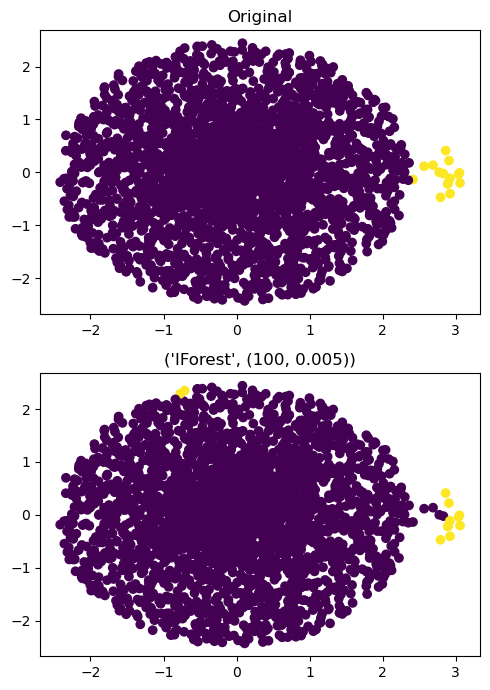

In [10]:
eval_plot(i = 18, dat = 'level1_cluster')

In [11]:
def valid_eval1(model = 'all', dat = 'Abnormal_far', measure_name1 = 'F1', measure_name2 = 'EM'):
    eval_dat = pd.read_csv("eval_dat.csv")
    
    if model == 'all' and dat != 'all':
        eval_df_new = eval_dat[eval_dat['Data'] == dat]
    elif dat == 'all' and model != 'all':
        eval_df_new = eval_dat[eval_dat['Model'].str.contains(model)]
    elif dat == 'all' and model == 'all':
        eval_df_new = eval_dat
    else:
        eval_df_new = eval_dat[(eval_dat['Model'].str.contains(model)) & (eval_dat['Data'] == dat)]
    
    x1 = eval_df_new[measure_name1]
    y1 = eval_df_new[measure_name2]
    x2 = eval_df_new[measure_name1+'_train']
    y2 = eval_df_new[measure_name2+'_train']
    
    fig1 = px.scatter(eval_df_new, x1, y1, symbol="Model", title="Test Dataset")
    fig2 = px.scatter(eval_df_new, x2, y2, symbol="Model", title="Train Dataset")
    fig1.show()
    corr_value = stats.pearsonr(x1, y1)[0]
    corr_value_spear = stats.spearmanr(x1,y1)[0]
    print("Correlation between {} & {} using {} model: pearson {} and spearman {}  for {} test dataset".format(measure_name1, measure_name2, model, corr_value, corr_value_spear, dat))
    fig2.show()
    corr_value_train = stats.pearsonr(x2, y2)[0]
    corr_value_spear_train = stats.spearmanr(x2,y2)[0]
    print("Correlation between {} & {} using {} model: pearson {} and spearman {}  for {} train dataset".format(measure_name1, measure_name2, model, corr_value_train, corr_value_spear_train, dat))

In [12]:
eval_dat = pd.read_csv("eval_dat.csv")
eval_dat_vis = eval_dat
eval_dat

,Data,#Samples,# Dimensions,Outlier Perc,Model,Recall,Recall_train,EM,EM_train,MV,MV_train,FP,FP_train,Precision,Precision_train,F1,F1_train,F5,F5_train
0,level1_far,10050,2,0.4975,"('IForest', (10, 0.005))",0.466667,0.657143,0.003085,0.003153,2.085378,2.081815,0.004000,0.001857,0.368421,0.638889,0.411765,0.647887,0.461929,0.656422
1,level1_far,10050,2,0.4975,"('IForest', (10, 0.01))",0.600000,0.600000,0.002472,0.002479,2.511982,2.481523,0.005667,0.007143,0.346154,0.295775,0.439024,0.396226,0.583541,0.577167
2,level1_far,10050,2,0.4975,"('IForest', (10, 0.05))",1.000000,0.942857,0.003093,0.002889,2.095779,2.183646,0.039667,0.045286,0.111940,0.094286,0.201342,0.171429,0.766208,0.700408
3,level1_far,10050,2,0.4975,"('IForest', (20, 0.005))",0.466667,0.600000,0.002719,0.002884,2.372444,2.272434,0.003667,0.002143,0.388889,0.583333,0.424242,0.591549,0.463104,0.599341
4,level1_far,10050,2,0.4975,"('IForest', (20, 0.01))",0.733333,0.800000,0.003580,0.003427,1.923535,1.988734,0.007000,0.006143,0.343750,0.394366,0.468085,0.528302,0.702703,0.769556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3190,Abnormal_far,5000,2,0.1000,"('LOF', (100, 'euclidean', 0.01))",0.000000,0.000000,0.000965,0.001290,9.044290,5.910292,0.046061,0.033743,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3191,Abnormal_far,5000,2,0.1000,"('LOF', (100, 'euclidean', 0.05))",0.000000,0.000000,0.001147,0.001412,6.250776,4.842442,0.044059,0.043752,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3192,Abnormal_far,5000,2,0.1000,"('LOF', (100, 'minkowski', 0.005))",1.000000,1.000000,0.003260,0.003207,2.055375,2.013810,0.048732,0.048041,0.026667,0.017544,0.051948,0.034483,0.416000,0.317073
3193,Abnormal_far,5000,2,0.1000,"('LOF', (100, 'minkowski', 0.01))",1.000000,1.000000,0.003261,0.003207,2.071929,1.992053,0.048064,0.048327,0.027027,0.017442,0.052632,0.034286,0.419355,0.315789


In [13]:
eval_dat_vis['Data_Model'] = eval_dat_vis['Data'] + eval_dat_vis['Model']

# General Picture

In [14]:
df = eval_dat_vis.sort_values(by="Recall")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Recall'], name="Recall"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['MV'], name="MV"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Recall vs. MV"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Recall</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>MV</b>", secondary_y=True)

fig.show()

In [15]:
df = eval_dat_vis.sort_values(by="Precision")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Precision'], name="Precision"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['MV'], name="MV"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Precision vs. MV"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Precision</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>MV</b>", secondary_y=True)

fig.show()

In [16]:
df = eval_dat_vis.sort_values(by="Recall")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Recall'], name="Recall"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Precision'], name="Precision"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['MV'], name="MV"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Recall & Precision vs. MV"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Recall & Precision</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>MV</b>", secondary_y=True)

fig.show()

In [17]:
df = eval_dat_vis.sort_values(by="F5")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['F5'], name="F5"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['MV'], name="MV"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="F5 vs. MV"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>F5</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>MV</b>", secondary_y=True)

fig.show()

In [18]:
df = eval_dat_vis.sort_values(by="MV")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['F5'], name="F5"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['MV'], name="MV"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="MV vs. F5"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>F5</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>MV</b>", secondary_y=True)

fig.show()

In [19]:
MV2, MV1 = [x for _, x in eval_dat_vis.groupby(eval_dat_vis['MV'] > 3)]
MV1[["MV", "F5"]].describe()

,MV,F5
count,1186.000000,1186.000000
mean,8449.752554,0.138745
std,19735.496680,0.191111
min,3.144104,0.000000
25%,7.453185,0.000000
50%,1016.106812,0.036932
75%,9943.163103,0.219876
max,143465.438509,0.856390


In [20]:
MV2[["MV", "F5"]].describe()

,MV,F5
count,2009.000000,2009.000000
mean,1.594739,0.532998
std,0.546118,0.354466
min,0.278358,0.000000
25%,1.157579,0.201550
50%,1.700107,0.572127
75%,2.044738,0.836634
max,2.895554,1.000000


In [21]:
df = eval_dat_vis.sort_values(by="Recall")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Recall'], name="Recall"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['EM'], name="EM"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Recall vs. EM"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Recall</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>EM</b>", secondary_y=True)

fig.show()

In [22]:
df = eval_dat_vis.sort_values(by="Precision")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Precision'], name="Precision"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['EM'], name="EM"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Precision vs. EM"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Precision</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>EM</b>", secondary_y=True)

fig.show()

In [23]:
df = eval_dat_vis.sort_values(by="Recall")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Recall'], name="Recall"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['Precision'], name="Precision"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['EM'], name="EM"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Recall & Precision vs. EM"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Recall & Precision</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>EM</b>", secondary_y=True)

fig.show()

In [24]:
df = eval_dat_vis.sort_values(by="F5")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['F5'], name="F5"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['EM'], name="EM"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="F5 vs. EM"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>F5</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>EM</b>", secondary_y=True)

fig.show()

In [25]:
df = eval_dat_vis.sort_values(by="EM")

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['F5'], name="F5"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df['Data_Model'], y=df['EM'], name="EM"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="EM vs. F5"
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset + Model")

# Set y-axes titles
fig.update_yaxes(title_text="<b>F5</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>EM</b>", secondary_y=True)

fig.show()

In [26]:
EM22, EM1 = [x for _, x in eval_dat_vis.groupby(eval_dat_vis['EM'] > 0.01)]
EM2, EM3 = [x for _, x in eval_dat_vis.groupby(eval_dat_vis['EM'] < 0.001)]
print("1st cluster (EM values greater than 0.01):")
EM1[["EM", "F5"]].describe()

1st cluster (EM values greater than 0.01):


,EM,F5
count,216.000000,216.000000
mean,0.018289,0.875276
std,0.008108,0.149133
min,0.010169,0.268041
25%,0.010476,0.760234
50%,0.018494,0.966544
75%,0.027437,0.997442
max,0.031893,1.000000


In [27]:
print("EM 2nd cluster (0.001 < EM < 0.01):")
EM2[["EM", "F5"]].describe()

EM 2nd cluster (0.001 < EM < 0.01):


,EM,F5
count,2306.000000,2306.000000
mean,0.005730,0.494184
std,0.005047,0.351645
min,0.001033,0.000000
25%,0.003070,0.183099
50%,0.004650,0.443434
75%,0.006300,0.800000
max,0.031893,1.000000


In [28]:
print("EM 3rd cluster (EM values less than 0.001):")
EM3[["EM", "F5"]].describe()

EM 3rd cluster (EM values less than 0.001):


,EM,F5
count,8.890000e+02,889.000000
mean,6.245491e-05,0.107712
std,1.850332e-04,0.185738
min,6.546841e-08,0.000000
25%,4.829701e-07,0.000000
50%,1.121887e-05,0.000000
75%,6.468692e-05,0.137748
max,9.659870e-04,0.856390


In [30]:
def valid_eval(model = 'all', dat = 'Abnormal_far', measure_name1 = 'F1', measure_name2 = 'MV'):
    
    eval_dat = pd.read_csv('eval_dat.csv')
    
    if model == 'all' and dat != 'all':
        eval_df_new = eval_dat[eval_dat['Data'] == dat]
    elif dat == 'all' and model != 'all':
        eval_df_new = eval_dat[eval_dat['Model'].str.contains(model)]
    elif dat == 'all' and model == 'all':
        eval_df_new = eval_dat
    else:
        eval_df_new = eval_dat[(eval_dat['Model'].str.contains(model)) & (eval_dat['Data'] == dat)]
    
    x1 = eval_df_new[measure_name1]
    y1 = eval_df_new[measure_name2]
    x2 = eval_df_new[measure_name1+'_train']
    y2 = eval_df_new[measure_name2+'_train']
    
    fig, axs = plt.subplots(2, 1,figsize=(5,7))
    
    axs[0].plot(x1, y1, 'o')
    axs[0].set_title(measure_name1 + ' vs. ' + measure_name2 + ' for ' + dat + ' test set using ' + model + ' model')
    
    axs[1].plot(x2, y2, 'o')
    axs[1].set_title(measure_name1 + ' vs. ' + measure_name2 + ' for ' + dat + ' train set using ' + model + ' model')
    
    for ax in axs.flat:
        ax.set(xlabel=measure_name1, ylabel=measure_name2)
        
    fig.tight_layout()
    plt.show()
    
    corr_value = stats.pearsonr(x1, y1)[0]
    corr_value_spear = stats.spearmanr(x1,y1)[0]
    print("Correlation between {} & {} using {} model: pearson {} and spearman {}  for {} test dataset".format(measure_name1, measure_name2, model, corr_value, corr_value_spear, dat))
    corr_value_train = stats.pearsonr(x2, y2)[0]
    corr_value_spear_train = stats.spearmanr(x2,y2)[0]
    print("Correlation between {} & {} using {} model: pearson {} and spearman {}  for {} train dataset".format(measure_name1, measure_name2, model, corr_value_train, corr_value_spear_train, dat))

# Model Level

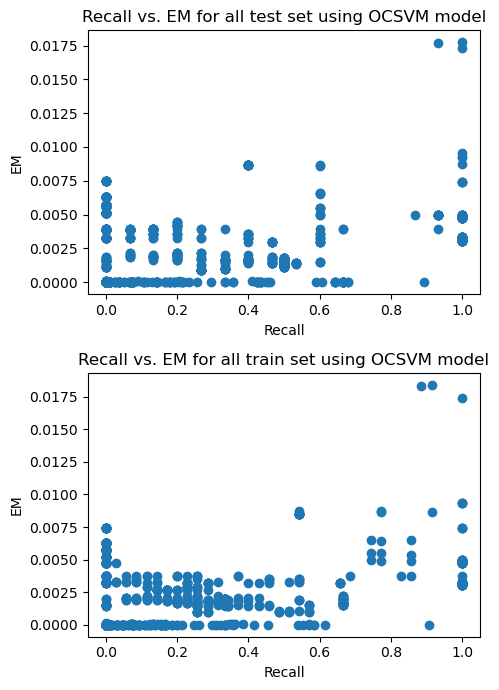

Correlation between Recall & EM using OCSVM model: pearson 0.10775815207576477 and spearman -0.061249416826213626  for all test dataset
Correlation between Recall & EM using OCSVM model: pearson 0.19301092433092593 and spearman -0.02277322121767735  for all train dataset


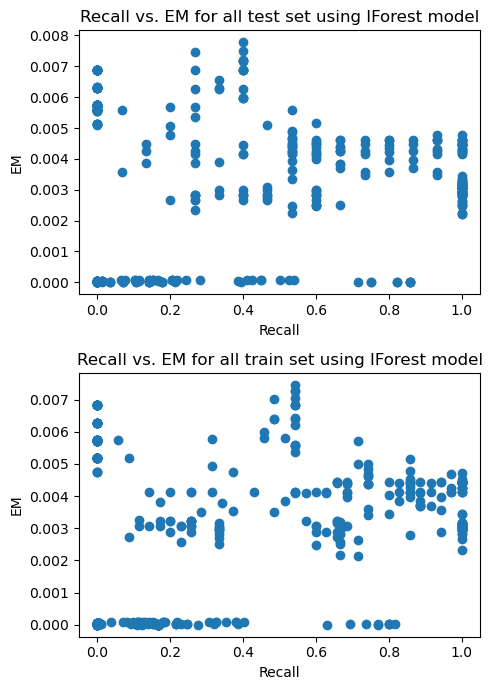

Correlation between Recall & EM using IForest model: pearson 0.05307980610582791 and spearman -0.06859046180864188  for all test dataset
Correlation between Recall & EM using IForest model: pearson 0.11759034360450502 and spearman -0.0634910430214967  for all train dataset


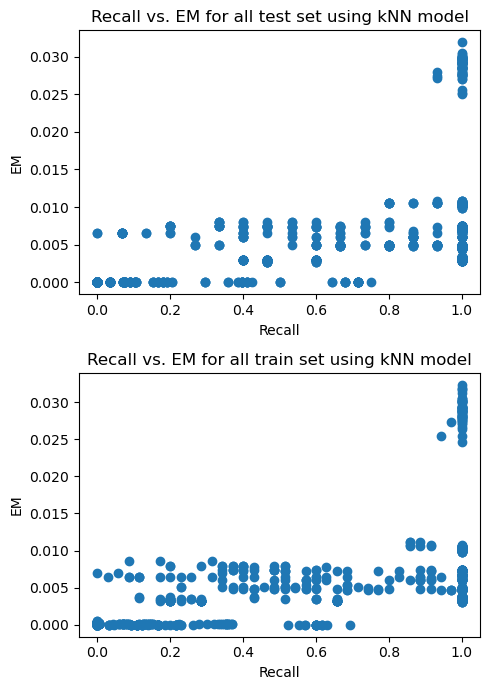

Correlation between Recall & EM using kNN model: pearson 0.47827916841367946 and spearman 0.5991952602117353  for all test dataset
Correlation between Recall & EM using kNN model: pearson 0.5428585447714521 and spearman 0.6987205394936192  for all train dataset


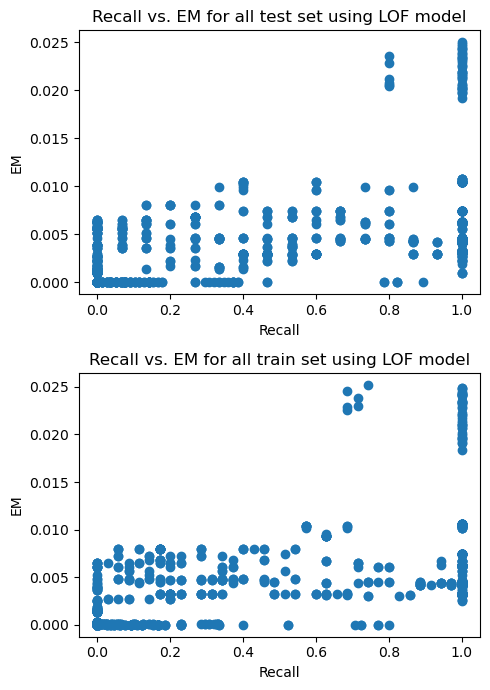

Correlation between Recall & EM using LOF model: pearson 0.5313370812580402 and spearman 0.6134725352168081  for all test dataset
Correlation between Recall & EM using LOF model: pearson 0.5708892521674653 and spearman 0.6594993584879525  for all train dataset


In [31]:
valid_eval(model='OCSVM', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='IForest', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='kNN', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='LOF', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'EM')

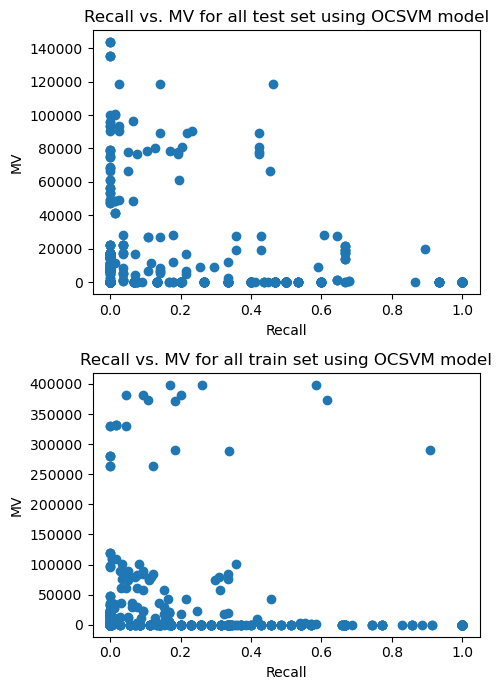

Correlation between Recall & MV using OCSVM model: pearson -0.1737343567686916 and spearman -0.005240643390511195  for all test dataset
Correlation between Recall & MV using OCSVM model: pearson -0.0962470432143058 and spearman -0.021182723273031098  for all train dataset


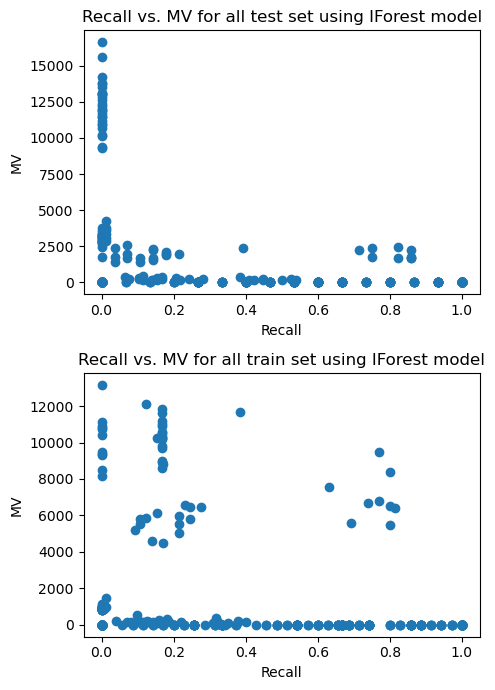

Correlation between Recall & MV using IForest model: pearson -0.3576239657125501 and spearman 0.04193630255574383  for all test dataset
Correlation between Recall & MV using IForest model: pearson -0.22962575613397257 and spearman 0.062396558806304125  for all train dataset


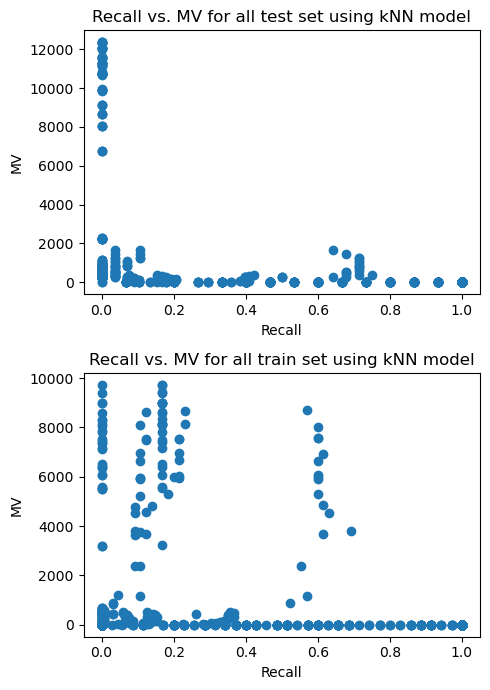

Correlation between Recall & MV using kNN model: pearson -0.4629611298333516 and spearman -0.6416740180585386  for all test dataset
Correlation between Recall & MV using kNN model: pearson -0.3168104750697207 and spearman -0.016628436454126254  for all train dataset


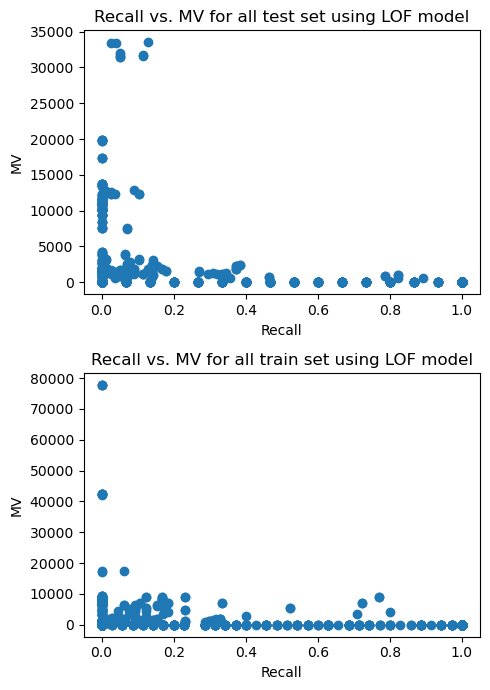

Correlation between Recall & MV using LOF model: pearson -0.3791101734122385 and spearman -0.6301519461574084  for all test dataset
Correlation between Recall & MV using LOF model: pearson -0.22274157569153405 and spearman -0.4823628050512977  for all train dataset


In [32]:
valid_eval(model='OCSVM', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='IForest', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='kNN', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='LOF', dat = 'all', measure_name1 = 'Recall', measure_name2 = 'MV')

# Dataset Level

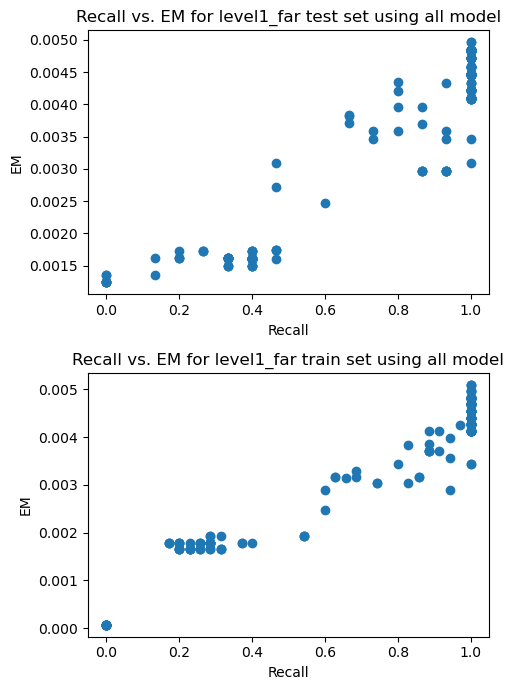

Correlation between Recall & EM using all model: pearson 0.9393293864591209 and spearman 0.8438007490742079  for level1_far test dataset
Correlation between Recall & EM using all model: pearson 0.9729341900755192 and spearman 0.8843735147465018  for level1_far train dataset


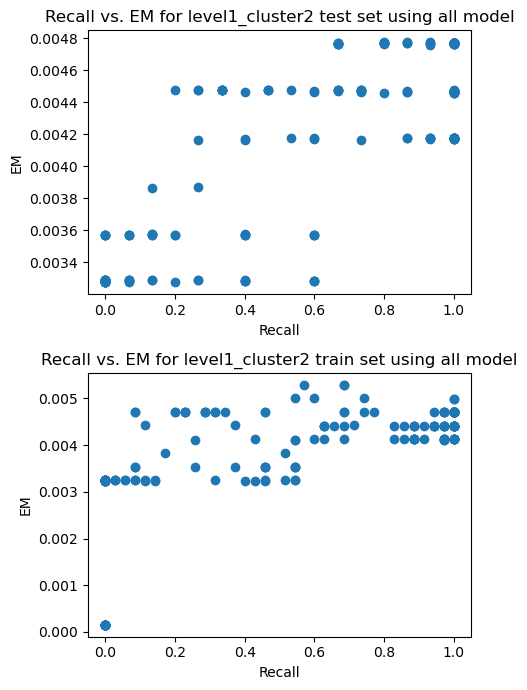

Correlation between Recall & EM using all model: pearson 0.821695269041254 and spearman 0.6844924107581384  for level1_cluster2 test dataset
Correlation between Recall & EM using all model: pearson 0.6881210296776081 and spearman 0.709068849248667  for level1_cluster2 train dataset


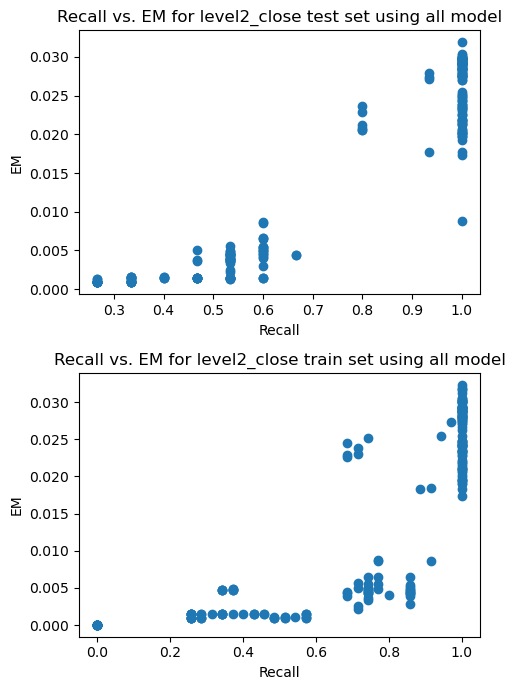

Correlation between Recall & EM using all model: pearson 0.9406678954602792 and spearman 0.9037583520201194  for level2_close test dataset
Correlation between Recall & EM using all model: pearson 0.8185905931072818 and spearman 0.8965930263158162  for level2_close train dataset


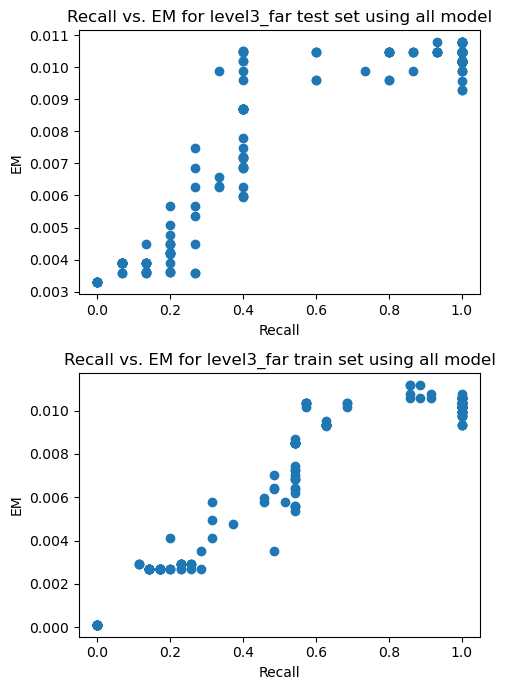

Correlation between Recall & EM using all model: pearson 0.9163487797245379 and spearman 0.8282437024922127  for level3_far test dataset
Correlation between Recall & EM using all model: pearson 0.9498342368216954 and spearman 0.8791812607729926  for level3_far train dataset


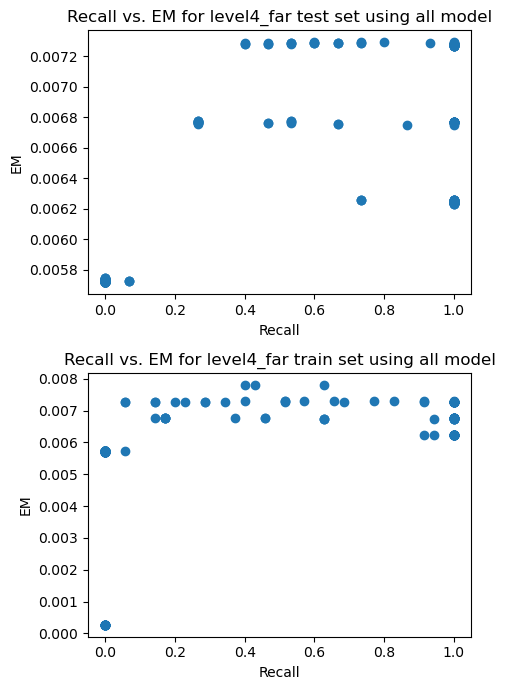

Correlation between Recall & EM using all model: pearson 0.7189937425506597 and spearman 0.7377009588751557  for level4_far test dataset
Correlation between Recall & EM using all model: pearson 0.4768995387024817 and spearman 0.7586267812882418  for level4_far train dataset


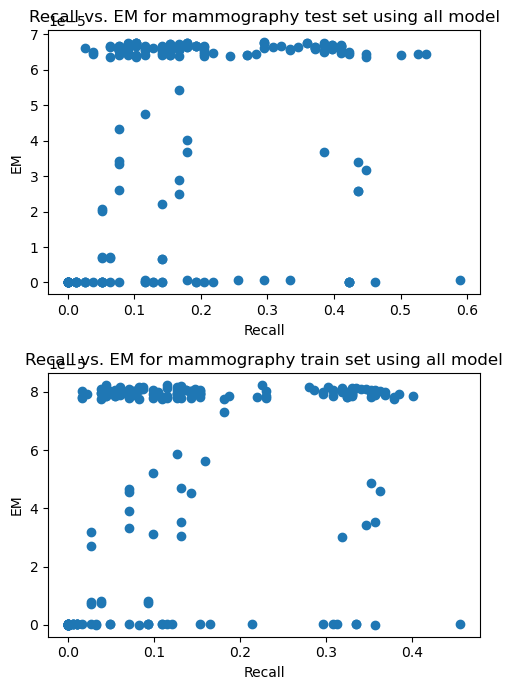

Correlation between Recall & EM using all model: pearson 0.2982389445525615 and spearman 0.3143539160055085  for mammography test dataset
Correlation between Recall & EM using all model: pearson 0.3980289592746001 and spearman 0.45132327863016675  for mammography train dataset


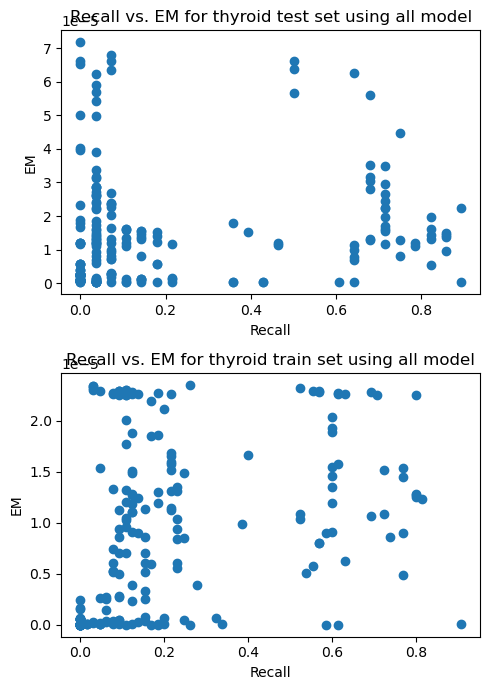

Correlation between Recall & EM using all model: pearson 0.1351255270679096 and spearman 0.2211053953327124  for thyroid test dataset
Correlation between Recall & EM using all model: pearson 0.3378482560684819 and spearman 0.4896396981093632  for thyroid train dataset


In [33]:
valid_eval(model='all', dat = 'level1_far', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'level1_cluster2', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'level2_close', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'level3_far', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'level4_far', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'mammography', measure_name1 = 'Recall', measure_name2 = 'EM')
valid_eval(model='all', dat = 'thyroid', measure_name1 = 'Recall', measure_name2 = 'EM')

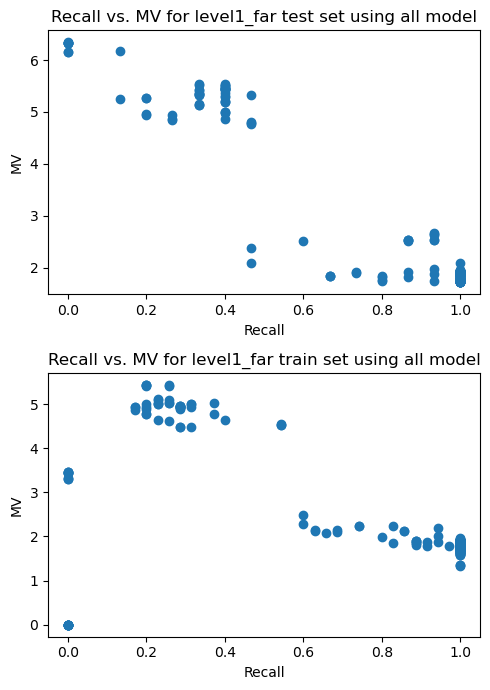

Correlation between Recall & MV using all model: pearson -0.9581655011086712 and spearman -0.770993427446527  for level1_far test dataset
Correlation between Recall & MV using all model: pearson -0.6070918381586019 and spearman -0.582659742438213  for level1_far train dataset


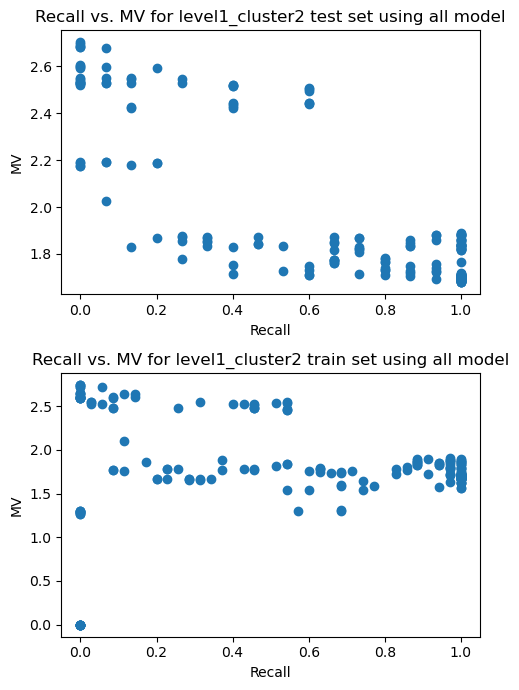

Correlation between Recall & MV using all model: pearson -0.8154203523952017 and spearman -0.7695353757281486  for level1_cluster2 test dataset
Correlation between Recall & MV using all model: pearson -0.11593929841740797 and spearman -0.24314358056028734  for level1_cluster2 train dataset


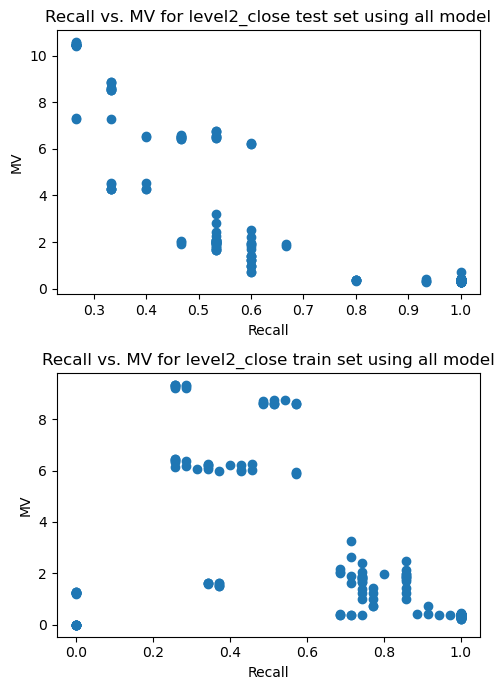

Correlation between Recall & MV using all model: pearson -0.8438001010977356 and spearman -0.8884616799858692  for level2_close test dataset
Correlation between Recall & MV using all model: pearson -0.5210202033951916 and spearman -0.6050292522694766  for level2_close train dataset


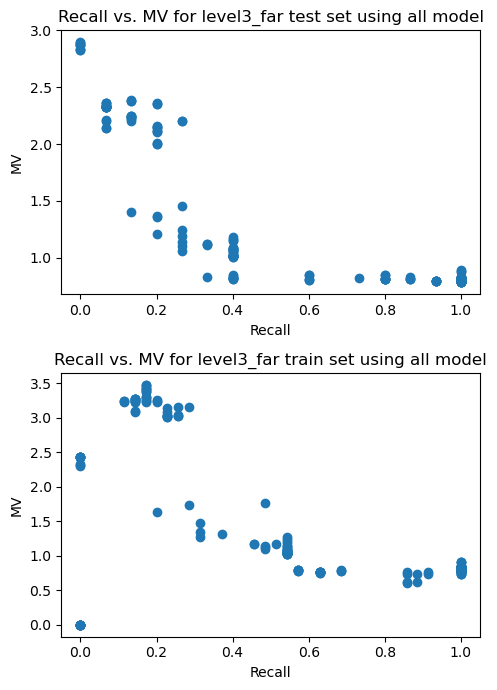

Correlation between Recall & MV using all model: pearson -0.8415365134733626 and spearman -0.9006999705160282  for level3_far test dataset
Correlation between Recall & MV using all model: pearson -0.6656143806382011 and spearman -0.5608946630167083  for level3_far train dataset


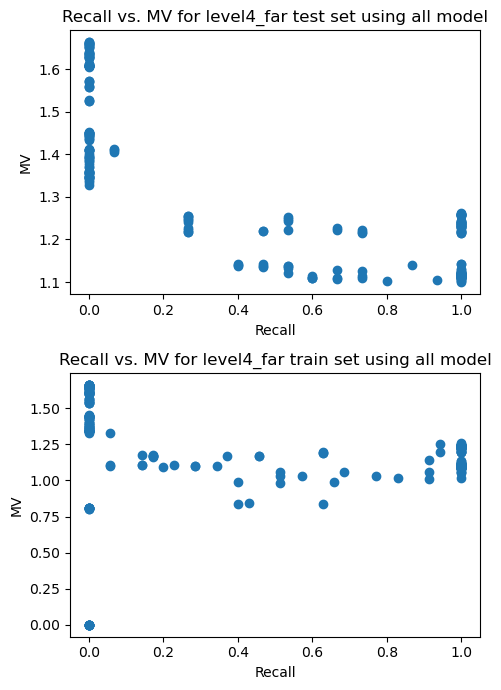

Correlation between Recall & MV using all model: pearson -0.80971559263034 and spearman -0.8156188526217607  for level4_far test dataset
Correlation between Recall & MV using all model: pearson -0.21627240593929084 and spearman -0.501192112241547  for level4_far train dataset


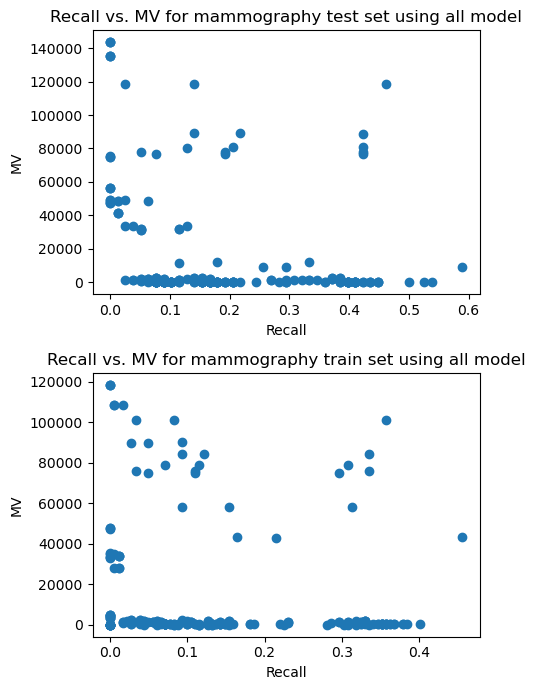

Correlation between Recall & MV using all model: pearson -0.2687051721630807 and spearman -0.39118013542166286  for mammography test dataset
Correlation between Recall & MV using all model: pearson -0.1615083422182807 and spearman -0.2679109009881658  for mammography train dataset


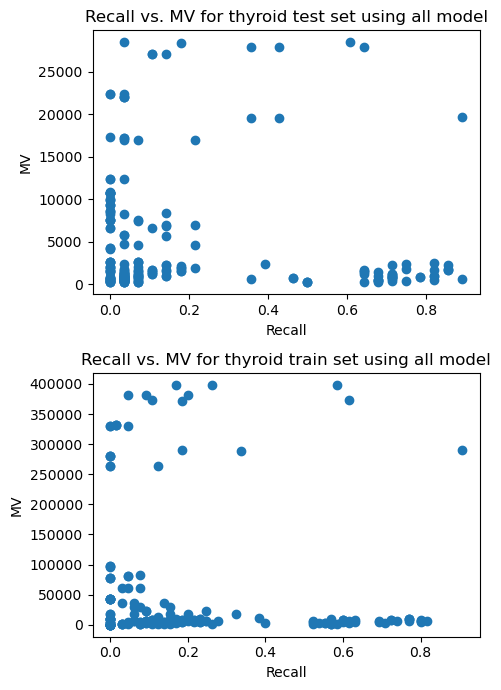

Correlation between Recall & MV using all model: pearson -0.10509536198574229 and spearman -0.158893448070345  for thyroid test dataset
Correlation between Recall & MV using all model: pearson -0.10438490747298182 and spearman -0.09189738117150245  for thyroid train dataset


In [34]:
valid_eval(model='all', dat = 'level1_far', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'level1_cluster2', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'level2_close', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'level3_far', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'level4_far', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'mammography', measure_name1 = 'Recall', measure_name2 = 'MV')
valid_eval(model='all', dat = 'thyroid', measure_name1 = 'Recall', measure_name2 = 'MV')

In [35]:
valid_eval1(model = 'all', dat = 'level1_far', measure_name1 = 'F5', measure_name2 = 'MV')

Correlation between F5 & MV using all model: pearson -0.9162923366397057 and spearman -0.682527112302013  for level1_far test dataset


Correlation between F5 & MV using all model: pearson -0.5990439796464491 and spearman -0.5438474065160368  for level1_far train dataset


In [36]:
corr_columns = ['Data', 'Model', 'Correlation_EM_Recall', 'Correlation_EM_Precision', 'Correlation_EM_F5']
corr_df_EM = pd.DataFrame(columns=corr_columns)
datasets = ['level1_far', 'level1_close', 'level1_cluster', 'level1_cluster2', 'level2_close', 'level3_far', 'level3_close',
            'level4_far', 'level4_close', 'mammography', 'thyroid', 'Wilt', 'Glass']
corr_value_Recall = []
corr_value_Precision = []

for model in ['IForest', 'kNN', 'OCSVM', 'LOF']:
    for dat in datasets:
        eval_df_new = eval_dat[(eval_dat['Model'].str.contains(model)) & (eval_dat['Data'] == dat)]
        x1 = eval_df_new['EM']
        y1 = eval_df_new['Recall']
        y2 = eval_df_new['Precision']
        y3 = eval_df_new['F5']
        
        corr_value_Recall=stats.pearsonr(x1, y1)[0]
        corr_value_Precision=stats.pearsonr(x1, y2)[0]
        corr_value_F5=stats.pearsonr(x1, y3)[0]
        corr_list = [dat, model, corr_value_Recall, corr_value_Precision, corr_value_F5]
        temp_df = pd.DataFrame(corr_list).transpose()
        temp_df.columns = corr_columns
        corr_df_EM = pd.concat([corr_df_EM, temp_df])

fig = px.scatter(corr_df_EM, x = corr_df_EM['Correlation_EM_Recall'], y = corr_df_EM['Correlation_EM_Precision'], title="EM", trendline="ols")
fig.show()

fig0 = px.scatter(corr_df_EM, x = corr_df_EM['Correlation_EM_Recall'], y = corr_df_EM['Correlation_EM_Precision'], title="EM", color = 'Model')
fig0.show()


corr_df_EM = corr_df_EM.reset_index(drop = True)
corr_df_EM

,Data,Model,Correlation_EM_Recall,Correlation_EM_Precision,Correlation_EM_F5
0,level1_far,IForest,0.656347,0.178798,0.738519
1,level1_close,IForest,0.009131,0.243055,0.153781
2,level1_cluster,IForest,0.625129,0.1637,0.668707
3,level1_cluster2,IForest,0.708985,0.33308,0.757908
4,level2_close,IForest,-0.032882,0.224416,0.019968
5,level3_far,IForest,0.710925,0.287874,0.725678
6,level3_close,IForest,NaN,NaN,NaN
7,level4_far,IForest,NaN,NaN,NaN
8,level4_close,IForest,0.104417,0.104417,0.104417
9,mammography,IForest,-0.019261,0.236639,-0.015689


In [37]:
df=corr_df_EM.dropna().reset_index(drop=True)
df

,Data,Model,Correlation_EM_Recall,Correlation_EM_Precision,Correlation_EM_F5
0,level1_far,IForest,0.656347,0.178798,0.738519
1,level1_close,IForest,0.009131,0.243055,0.153781
2,level1_cluster,IForest,0.625129,0.1637,0.668707
3,level1_cluster2,IForest,0.708985,0.33308,0.757908
4,level2_close,IForest,-0.032882,0.224416,0.019968
5,level3_far,IForest,0.710925,0.287874,0.725678
6,level4_close,IForest,0.104417,0.104417,0.104417
7,mammography,IForest,-0.019261,0.236639,-0.015689
8,thyroid,IForest,-0.031216,0.2203,-0.025638
9,Wilt,IForest,0.177823,0.198207,0.178694


In [38]:
df['Correlation_EM_Recall'] = df['Correlation_EM_Recall'].astype(float)
df['Correlation_EM_Precision'] = df['Correlation_EM_Precision'].astype(float)
df

,Data,Model,Correlation_EM_Recall,Correlation_EM_Precision,Correlation_EM_F5
0,level1_far,IForest,0.656347,0.178798,0.738519
1,level1_close,IForest,0.009131,0.243055,0.153781
2,level1_cluster,IForest,0.625129,0.163700,0.668707
3,level1_cluster2,IForest,0.708985,0.333080,0.757908
4,level2_close,IForest,-0.032882,0.224416,0.019968
5,level3_far,IForest,0.710925,0.287874,0.725678
6,level4_close,IForest,0.104417,0.104417,0.104417
7,mammography,IForest,-0.019261,0.236639,-0.015689
8,thyroid,IForest,-0.031216,0.220300,-0.025638
9,Wilt,IForest,0.177823,0.198207,0.178694


In [39]:
IF_fisher = independent_corr(df.loc[0:9,'Correlation_EM_Recall'], df.loc[0:9,'Correlation_EM_Precision'], 27)
IF_fisher

(0    2.097956
 1    0.827530
 2    1.968280
 3    1.866633
 4    0.904805
 5    2.053541
 6    0.000000
 7    0.902311
 8    0.884031
 9    0.073204
 dtype: float64,
 array([0.03590899, 0.40793655, 0.04903586, 0.0619529 , 0.36556859,
        0.04002011, 1.        , 0.36689182, 0.37667926, 0.94164411]))

In [40]:
kNN_fisher = independent_corr(df.loc[10:19,'Correlation_EM_Recall'], df.loc[10:19,'Correlation_EM_Precision'], 63)
kNN_fisher

(10    0.029481
 11    3.233028
 12    0.189735
 13    0.851531
 14    1.565587
 15    1.040870
 16    1.722742
 17    0.076209
 18    0.413076
 19    3.308548
 dtype: float64,
 array([9.76480702e-01, 1.22485571e-03, 8.49516432e-01, 3.94474306e-01,
        1.17445259e-01, 2.97935730e-01, 8.49351879e-02, 9.39253124e-01,
        6.79551055e-01, 9.37812734e-04]))

In [41]:
OCSVM_fisher = independent_corr(df.loc[20:30,'Correlation_EM_Recall'], df.loc[20:30,'Correlation_EM_Precision'], 60)
OCSVM_fisher

(20    7.765397
 21    2.071218
 22    2.466135
 23    3.481749
 24    3.928059
 25    2.729411
 26    0.405201
 27    0.883734
 28    0.192476
 29    0.077013
 30    0.092682
 dtype: float64,
 array([8.21565038e-15, 3.83384565e-02, 1.36579809e-02, 4.98151018e-04,
        8.56343458e-05, 6.34475579e-03, 6.85329597e-01, 3.76839660e-01,
        8.47369304e-01, 9.38613000e-01, 9.26156381e-01]))

In [42]:
LOF_fisher = independent_corr(df.loc[31:42,'Correlation_EM_Recall'], df.loc[31:42,'Correlation_EM_Precision'], 63)
LOF_fisher

(31    6.318331
 32    2.270937
 33    0.957426
 34    1.494182
 35    8.531413
 36    3.145478
 37    1.052061
 38    0.556326
 39    0.170900
 40    1.374480
 41    1.106165
 42    0.817369
 dtype: float64,
 array([2.64402944e-10, 2.31508051e-02, 3.38352340e-01, 1.35128168e-01,
        0.00000000e+00, 1.65815929e-03, 2.92771528e-01, 5.77988299e-01,
        8.64302778e-01, 1.69292834e-01, 2.68655158e-01, 4.13717578e-01]))

In [43]:
fig1 = px.scatter(corr_df_EM, x = 'Data', y = 'Correlation_EM_Recall', color = 'Model', title="EM_Recall")
fig1.show()

In [44]:
fig2 = px.scatter(corr_df_EM, x = 'Data', y = 'Correlation_EM_Precision', color = 'Model', title="EM_Precision")
fig2.show()

In [45]:
corr_columns = ['Data', 'Model', 'Correlation_MV_Recall', 'Correlation_MV_Precision', 'Correlation_MV_F5']
corr_df_MV = pd.DataFrame(columns=corr_columns)
datasets = ['level1_far', 'level1_close', 'level1_cluster', 'level1_cluster2', 'level2_close', 'level3_far', 'level3_close',
            'level4_far', 'level4_close', 'mammography', 'thyroid', 'Wilt', 'Glass']
corr_value_Recall = []
corr_value_Precision = []

for model in ['IForest', 'kNN', 'OCSVM', 'LOF']:
    for dat in datasets:
        eval_df_new = eval_dat[(eval_dat['Model'].str.contains(model)) & (eval_dat['Data'] == dat)]
        x1 = eval_df_new['MV']
        y1 = eval_df_new['Recall']
        y2 = eval_df_new['Precision']
        y3 = eval_df_new['F5']
        
        corr_value_Recall=stats.pearsonr(x1, y1)[0]
        corr_value_Precision=stats.pearsonr(x1, y2)[0]
        corr_value_F5=stats.pearsonr(x1, y3)[0]
        corr_list = [dat, model, corr_value_Recall, corr_value_Precision, corr_value_F5]
        temp_df = pd.DataFrame(corr_list).transpose()
        temp_df.columns = corr_columns
        corr_df_MV = pd.concat([corr_df_MV, temp_df])

        
fig = px.scatter(corr_df_MV, x = corr_df_MV['Correlation_MV_Recall'], y = corr_df_MV['Correlation_MV_Precision'], title="MV", trendline="ols")
fig.show()

fig0 = px.scatter(corr_df_MV, x = corr_df_MV['Correlation_MV_Recall'], y = corr_df_MV['Correlation_MV_Precision'], title="MV", color = 'Model')
fig0.show()
    
corr_df_MV = corr_df_MV.reset_index(drop = True)
corr_df_MV

,Data,Model,Correlation_MV_Recall,Correlation_MV_Precision,Correlation_MV_F5
0,level1_far,IForest,-0.61477,-0.213375,-0.700499
1,level1_close,IForest,-0.075441,-0.210618,-0.220435
2,level1_cluster,IForest,-0.724439,-0.101957,-0.747545
3,level1_cluster2,IForest,-0.625529,-0.326763,-0.692253
4,level2_close,IForest,-0.104367,-0.07027,0.027036
5,level3_far,IForest,-0.735231,-0.301504,-0.780135
6,level3_close,IForest,NaN,NaN,NaN
7,level4_far,IForest,NaN,NaN,NaN
8,level4_close,IForest,-0.050201,-0.050201,-0.050201
9,mammography,IForest,-0.26594,-0.080567,-0.273147


In [46]:
df1=corr_df_MV.dropna().reset_index(drop=True)
df1

,Data,Model,Correlation_MV_Recall,Correlation_MV_Precision,Correlation_MV_F5
0,level1_far,IForest,-0.61477,-0.213375,-0.700499
1,level1_close,IForest,-0.075441,-0.210618,-0.220435
2,level1_cluster,IForest,-0.724439,-0.101957,-0.747545
3,level1_cluster2,IForest,-0.625529,-0.326763,-0.692253
4,level2_close,IForest,-0.104367,-0.07027,0.027036
5,level3_far,IForest,-0.735231,-0.301504,-0.780135
6,level4_close,IForest,-0.050201,-0.050201,-0.050201
7,mammography,IForest,-0.26594,-0.080567,-0.273147
8,thyroid,IForest,0.104377,0.027159,0.109064
9,Wilt,IForest,0.044121,0.038335,0.043881


In [47]:
df1['Correlation_MV_Recall'] = df1['Correlation_MV_Recall'].astype(float)
df1['Correlation_MV_Precision'] = df1['Correlation_MV_Precision'].astype(float)
df1

,Data,Model,Correlation_MV_Recall,Correlation_MV_Precision,Correlation_MV_F5
0,level1_far,IForest,-0.614770,-0.213375,-0.700499
1,level1_close,IForest,-0.075441,-0.210618,-0.220435
2,level1_cluster,IForest,-0.724439,-0.101957,-0.747545
3,level1_cluster2,IForest,-0.625529,-0.326763,-0.692253
4,level2_close,IForest,-0.104367,-0.070270,0.027036
5,level3_far,IForest,-0.735231,-0.301504,-0.780135
6,level4_close,IForest,-0.050201,-0.050201,-0.050201
7,mammography,IForest,-0.265940,-0.080567,-0.273147
8,thyroid,IForest,0.104377,0.027159,0.109064
9,Wilt,IForest,0.044121,0.038335,0.043881


In [48]:
IF_fisher_MV = independent_corr(df1.loc[0:9,'Correlation_MV_Recall'], df1.loc[0:9,'Correlation_MV_Precision'], 27)
IF_fisher_MV

(0    1.731525
 1    0.478856
 2    2.821897
 3    1.367758
 4    0.119033
 5    2.178388
 6    0.000000
 7    0.664236
 8    0.268788
 9    0.020079
 dtype: float64,
 array([0.08335808, 0.63204128, 0.00477405, 0.17138782, 0.90524929,
        0.02937717, 1.        , 0.50653942, 0.78809284, 0.98398072]))

In [49]:
kNN_fisher_MV = independent_corr(df1.loc[10:19,'Correlation_MV_Recall'], df1.loc[10:19,'Correlation_MV_Precision'], 63)
kNN_fisher_MV

(10    0.025155
 11    3.726245
 12    6.550927
 13    1.055400
 14    0.320054
 15    1.093844
 16    1.646042
 17    0.851729
 18    0.615178
 19    3.229743
 dtype: float64,
 array([9.79931362e-01, 1.94353255e-04, 5.71811487e-11, 2.91242425e-01,
        7.48927595e-01, 2.74023318e-01, 9.97551197e-02, 3.94364688e-01,
        5.38436934e-01, 1.23901335e-03]))

In [50]:
OCSVM_fisher_MV = independent_corr(df1.loc[20:30,'Correlation_MV_Recall'], df1.loc[20:30,'Correlation_MV_Precision'], 60)
OCSVM_fisher_MV

(20    7.063180
 21    2.247490
 22    2.510167
 23    3.846107
 24    4.526201
 25    2.776945
 26    0.617792
 27    0.492760
 28    0.243515
 29    0.127248
 30    0.244006
 dtype: float64,
 array([1.62736491e-12, 2.46087036e-02, 1.20673973e-02, 1.20009170e-04,
        6.00534424e-06, 5.48723912e-03, 5.36712574e-01, 6.22182523e-01,
        8.07606179e-01, 8.98743975e-01, 8.07226296e-01]))

In [51]:
LOF_fisher_MV = independent_corr(df1.loc[31:42,'Correlation_MV_Recall'], df1.loc[31:42,'Correlation_MV_Precision'], 63)
LOF_fisher_MV

(31    14.448081
 32     2.883659
 33     1.290289
 34     2.555912
 35     6.939077
 36     2.937105
 37     2.356946
 38     2.398712
 39     0.002458
 40     0.603092
 41     0.610004
 42     2.327069
 dtype: float64,
 array([0.00000000e+00, 3.93083533e-03, 1.96950497e-01, 1.05909943e-02,
        3.94662081e-12, 3.31292427e-03, 1.84259077e-02, 1.64528580e-02,
        9.98039172e-01, 5.46447773e-01, 5.41859476e-01, 1.99616000e-02]))

In [52]:
fig1 = px.scatter(corr_df_MV, x = 'Data', y = 'Correlation_MV_Recall', color = 'Model', title="MV_Recall")
fig1.show()

In [53]:
fig2 = px.scatter(corr_df_MV, x = 'Data', y = 'Correlation_MV_Precision', color = 'Model', title="MV_Precision")
fig2.show()

In [54]:
def eval_score(i = 0, dat = 'Abnormal_close'):
    f_model = open(os.path.join("models", dat + f"_MODEL_{combined_list[i]}"), "rb")
    eval_f_model = pickle.load(f_model)
    X, y = read_data(dat)
    X_norm = standardizer(X)
    test_size = 0.30
    X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size = test_size, stratify = y, random_state = 12)
    y_pred = eval_f_model.predict(X_test)
    y_score = eval_f_model.decision_function(X_test)
    return y_score, y_pred

In [55]:
y_score, y_pred = eval_score(i = 150, dat = 'level1_far')

loading level1_far


loading level1_far


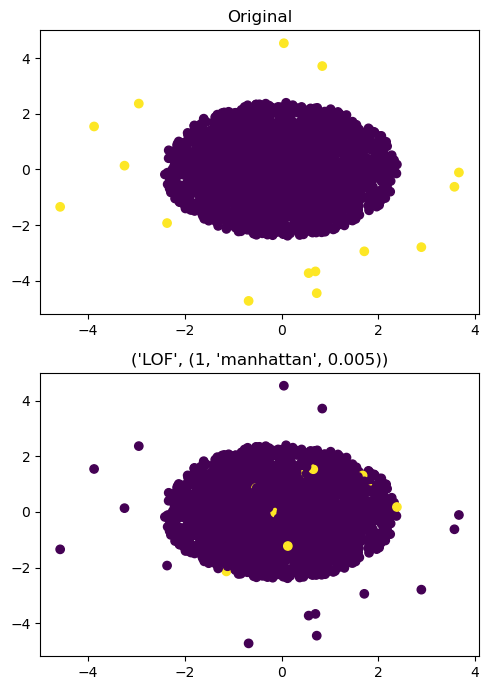

In [56]:
eval_plot(i = 150, dat = 'level1_far')

In [57]:
with np.printoptions(threshold=np.inf):
    print(y_score)

[ 1.          1.          1.          1.          2.40150406  1.
  1.          1.66560307  1.          1.54426719  2.3199245   1.
  1.          1.          1.          1.          1.82600619  1.
  1.          1.          1.          1.          1.          1.
  1.          1.          1.16193911  1.          1.41656701  1.
  2.77448546  1.01186322  1.35340284  1.04522594  1.          1.37880775
  1.18482184  1.          1.          1.06821932  2.09631914  2.02311245
  2.44151352  1.          1.24642743  1.          1.          1.28157278
  2.60085414  1.          3.08069112  1.          1.31397321  1.
  2.41666481  1.          1.          2.69448508  1.          1.
  1.          1.          1.10773917  1.          2.24818667  2.37957412
  1.          1.          1.70257353  1.          1.          1.
  1.78343377  1.84579331  1.          1.          1.          1.
  1.          1.          1.          1.          1.50648418  1.
  1.          1.55978811  1.18977303  1.          2.162312

In [58]:
y_score.min()

1.0

In [59]:
np.where(y_score > 5)

(array([  98,  180,  388,  398,  401,  403,  441,  467,  481,  483,  511,
         543,  576,  661,  664,  839,  841,  862,  872,  884,  940,  958,
        1045, 1082, 1116, 1267, 1335, 1510, 1623, 1660, 1699, 1746, 1859,
        1894, 1915, 1938, 1940, 1972, 1987, 2000, 2072, 2095, 2131, 2133,
        2275, 2302, 2353, 2382, 2421, 2476, 2478, 2534, 2578, 2594, 2596,
        2601, 2699, 2731, 2733, 2759, 2764, 2872, 2914, 2927, 2959, 3003,
        3012], dtype=int64),)

In [59]:
np.where(y_pred == 1)

(array([ 403,  576,  841, 1116, 1335, 1510, 1623, 1746, 1894, 1915, 1940,
        1972, 2072, 2353, 2476, 2478, 2733, 2764, 2914, 3003, 3012],
       dtype=int64),)

In [60]:
pd.set_option('display.max_rows', None)
eval_dat[eval_dat['Data'] == 'Glass'].sort_values(by="F5")

,Data,#Samples,# Dimensions,Outlier Perc,Model,Recall,Recall_train,EM,EM_train,MV,MV_train,FP,FP_train,Precision,Precision_train,F1,F1_train,F5,F5_train,Data_Model
2556,Glass,214,7,4.2056,"('IForest', (10, 0.005))",0.000000,0.166667,3.441911e-07,5.206458e-07,15594.984644,11603.604240,0.000000,0.000000,0.000000,1.000000,0.000000,0.285714,0.000000,0.172185,"Glass('IForest', (10, 0.005))"
2695,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.3, 0.01))",0.000000,0.000000,3.437596e-07,3.404509e-07,17487.543859,21052.981967,0.032258,0.006993,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.3, 0.01))"
2696,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.3, 0.05))",0.000000,0.000000,3.109941e-07,3.395642e-07,17583.228439,20386.631221,0.016129,0.013986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.3, 0.05))"
2697,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.5, 0.005))",0.000000,0.000000,3.779211e-07,3.707604e-07,14715.169831,17547.017915,0.032258,0.013986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.5, 0.005))"
2698,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.5, 0.01))",0.000000,0.000000,3.437099e-07,3.403737e-07,16082.805453,18555.145988,0.016129,0.013986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.5, 0.01))"
2699,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.5, 0.05))",0.000000,0.000000,3.440761e-07,3.404710e-07,16923.914549,20425.729955,0.016129,0.013986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.5, 0.05))"
2700,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.7, 0.005))",0.000000,0.000000,3.437606e-07,3.404386e-07,17483.300693,21045.791954,0.048387,0.013986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.7, 0.005))"
2701,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.7, 0.01))",0.000000,0.000000,3.110082e-07,3.395478e-07,17547.758176,20407.265910,0.080645,0.055944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.7, 0.01))"
2702,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.7, 0.05))",0.000000,0.000000,3.778920e-07,3.707290e-07,14687.269005,17621.222051,0.064516,0.055944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.7, 0.05))"
2703,Glass,214,7,4.2056,"('OCSVM', ('sigmoid', 0.9, 0.005))",0.000000,0.000000,3.437370e-07,3.403819e-07,16047.554050,18512.745258,0.096774,0.055944,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"Glass('OCSVM', ('sigmoid', 0.9, 0.005))"
